In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import control as ct
import lmfit
from pytz import timezone
import vaex
import pvlib

import sys
sys.path.append('../../../')

from utils.plot import config_matplotlib, figsize, fig_save_and_show  # noqa: E402

config_matplotlib()
latex_img_path = '/home/joaoantoniocardoso/workspace_TCC/repo/tcc/imgs/'

def input_output_response_to_pandas(response: ct.input_output_response):
    # until this gets merged: https://github.com/python-control/python-control/issues/957
    data = {'time': response.time}
    if response.ninputs > 0:
        data.update(
            {name: response.inputs[i] for i, name in enumerate(response.input_labels)})
    if response.noutputs > 0:
        data.update(
            {name: response.outputs[i] for i, name in enumerate(response.output_labels)})
    if response.nstates > 0:
        data.update(
            {name: response.states[i] for i, name in enumerate(response.state_labels)})
    return pd.DataFrame(data)

# Data

In [28]:
tzinfo = timezone("America/Sao_Paulo")

events = [
    {
        "name": "01.Curta",
        "start": pd.Timestamp(
            year=2020, month=1, day=29, hour=13, minute=51, second=59, tzinfo=tzinfo
        ),
        "end": pd.Timestamp(
            year=2020, month=1, day=29, hour=14, minute=20, second=25, tzinfo=tzinfo
        ),
    },
    {
        "name": "02.Longa",
        "start": pd.Timestamp(
            year=2020, month=1, day=30, hour=11, minute=16, second=45, tzinfo=tzinfo
        ),
        "end": pd.Timestamp(
            year=2020, month=1, day=30, hour=14, minute=55, second=30, tzinfo=tzinfo
        ),
    },
    {
        "name": "03.Revezamento",
        "start": pd.Timestamp(
            year=2020, month=1, day=31, hour=11, minute=23, second=23, tzinfo=tzinfo
        ),
        "end": pd.Timestamp(
            year=2020, month=1, day=31, hour=12, minute=27, second=23, tzinfo=tzinfo
        ),
    },
    {
        "name": "04.Curta",
        "start": pd.Timestamp(
            year=2020, month=2, day=1, hour=10, minute=15, second=15, tzinfo=tzinfo
        ),
        "end": pd.Timestamp(
            year=2020, month=2, day=1, hour=11, minute=37, second=28, tzinfo=tzinfo
        ),
    },
    {
        "name": "05.Curta",
        "start": pd.Timestamp(
            year=2020, month=2, day=1, hour=13, minute=15, second=9, tzinfo=tzinfo
        ),
        "end": pd.Timestamp(
            year=2020, month=2, day=1, hour=13, minute=32, second=55, tzinfo=tzinfo
        ),
    },
    {
        "name": "07.Sprint",
        "start": pd.Timestamp(
            year=2020, month=2, day=2, hour=11, minute=58, second=27, tzinfo=tzinfo
        ),
        "end": pd.Timestamp(
            year=2020, month=2, day=2, hour=11, minute=59, second=9, tzinfo=tzinfo
        ),
    },
]

events = pd.DataFrame(events).set_index('name')
events

,start,end
name,,
01.Curta,2020-01-29 13:51:59-03:00,2020-01-29 14:20:25-03:00
02.Longa,2020-01-30 11:16:45-03:00,2020-01-30 14:55:30-03:00
03.Revezamento,2020-01-31 11:23:23-03:00,2020-01-31 12:27:23-03:00
04.Curta,2020-02-01 10:15:15-03:00,2020-02-01 11:37:28-03:00
05.Curta,2020-02-01 13:15:09-03:00,2020-02-01 13:32:55-03:00
07.Sprint,2020-02-02 11:58:27-03:00,2020-02-02 11:59:09-03:00


'original columns:'

Index(['Battery Pack Voltage', 'Pilot Duty Cycle', 'Pilot Motor On',
       'Pilot Boat On', 'ESC Duty Cycle', 'Motor Angular Speed',
       'MPPT 1 Input Voltage', 'MPPT 2 Input Voltage', 'MPPT 3 Input Voltage',
       'MPPT 4 Input Voltage', 'MPPT 1 Output Voltage',
       'MPPT 2 Output Voltage', 'MPPT 3 Output Voltage',
       'MPPT 4 Output Voltage', 'MPPT 1 Input Current', 'MPPT 2 Input Current',
       'MPPT 3 Input Current', 'MPPT 4 Input Current', 'MPPT 1 Duty Cycle',
       'MPPT 2 Duty Cycle', 'MPPT 3 Duty Cycle', 'MPPT 4 Duty Cycle',
       'MPPT 1 Input Power', 'MPPT 2 Input Power', 'MPPT 3 Input Power',
       'MPPT 4 Input Power', 'MPPTs Input Power', 'MPPT 1 Output Current',
       'MPPT 2 Output Current', 'MPPT 3 Output Current',
       'MPPT 4 Output Current', 'MPPTs Output Current', 'MPPT 1 Output Power',
       'MPPT 2 Output Power', 'MPPT 3 Output Power', 'MPPT 4 Output Power',
       'MPPTs Output Power', 'Battery Current', 'Battery Power',
       'ESC Input Curre

'renamed columns:'

{'Battery Pack Voltage': 'bat_v',
 'Battery Current': 'bat_i',
 'ESC Duty Cycle': 'esc_d',
 'Motor Angular Speed': 'motor_w',
 'ESC Input Power': 'esc_pi',
 'ESC Input Current': 'esc_ii',
 'MPPT 1 Input Current': 'mppt1_ii',
 'MPPT 2 Input Current': 'mppt2_ii',
 'MPPT 3 Input Current': 'mppt3_ii',
 'MPPT 4 Input Current': 'mppt4_ii',
 'MPPT 1 Input Voltage': 'mppt1_vi',
 'MPPT 2 Input Voltage': 'mppt2_vi',
 'MPPT 3 Input Voltage': 'mppt3_vi',
 'MPPT 4 Input Voltage': 'mppt4_vi',
 'MPPT 1 Duty Cycle': 'mppt1_d',
 'MPPT 2 Duty Cycle': 'mppt2_d',
 'MPPT 3 Duty Cycle': 'mppt3_d',
 'MPPT 4 Duty Cycle': 'mppt4_d',
 'MPPT 1 Output Current': 'mppt1_io',
 'MPPT 2 Output Current': 'mppt2_io',
 'MPPT 3 Output Current': 'mppt3_io',
 'MPPT 4 Output Current': 'mppt4_io',
 'Solar POA': 'solar_poa',
 'Wind Speed': 'wind_v',
 'Air Temperature': 'air_t'}

'selected columns:'

Index(['bat_v', 'bat_i', 'esc_d', 'motor_w', 'esc_pi', 'esc_ii', 'mppt1_ii',
       'mppt2_ii', 'mppt3_ii', 'mppt4_ii', 'mppt1_vi', 'mppt2_vi', 'mppt3_vi',
       'mppt4_vi', 'mppt1_d', 'mppt2_d', 'mppt3_d', 'mppt4_d', 'mppt1_io',
       'mppt2_io', 'mppt3_io', 'mppt4_io', 'solar_poa', 'wind_v', 'air_t'],
      dtype='object')

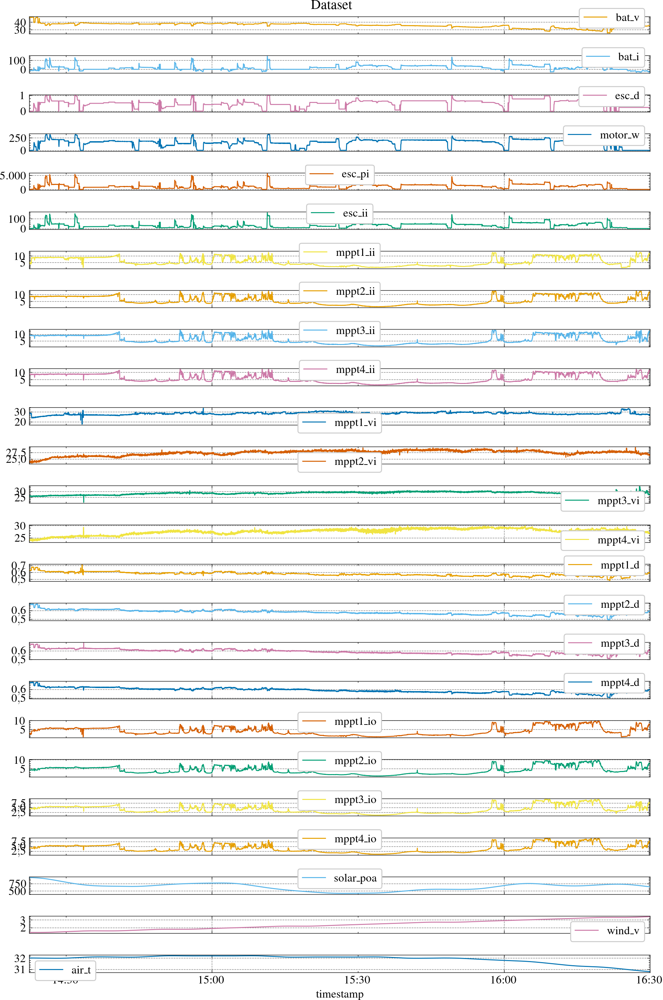

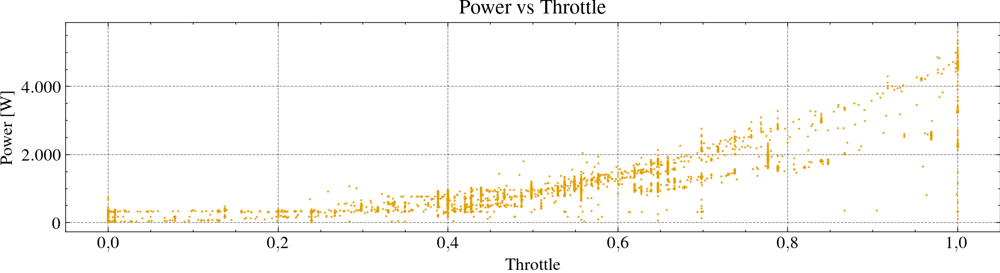

In [29]:
# From Revezamento
start = pd.Timestamp(
    year=2020, month=1, day=31, hour=11, minute=22, second=30, tzinfo=tzinfo
).tz_convert(None)
end = pd.Timestamp(
    year=2020, month=1, day=31, hour=13, minute=30, second=0, tzinfo=tzinfo
).tz_convert(None)

df = vaex.from_csv("../../../models/2020/boat_data_1s.csv").to_pandas_df()
# df = vaex.from_csv("../../../models/2020/boat_data_100ms.csv").to_pandas_df()
df["timestamp"] = pd.DatetimeIndex(df["timestamp"]).tz_convert(None)
df = df.set_index("timestamp")
display('original columns:', df.columns)

renamed_columns = {
    'Battery Pack Voltage': 'bat_v',
    'Battery Current': 'bat_i',
    'ESC Duty Cycle': 'esc_d',
    'Motor Angular Speed': 'motor_w',
    'ESC Input Power': 'esc_pi',
    'ESC Input Current': 'esc_ii',
    **{f'MPPT {i} Input Current': f'mppt{i}_ii' for i in range(1,5)},
    **{f'MPPT {i} Input Voltage': f'mppt{i}_vi' for i in range(1,5)},
    **{f'MPPT {i} Duty Cycle': f'mppt{i}_d' for i in range(1,5)},
    **{f'MPPT {i} Output Current': f'mppt{i}_io' for i in range(1,5)},
    'Solar POA': 'solar_poa',
    'Wind Speed': 'wind_v',
    'Air Temperature': 'air_t',
}
display('renamed columns:', renamed_columns)

df = df.loc[
    (df.index >= start) & (df.index <= end),
    renamed_columns.keys(),
].rename(columns=renamed_columns)

display('selected columns:', df.columns)

df = df.dropna()
df = df.resample('1s').mean().interpolate(method="time", limit_area='inside')
dfa = df.copy(deep=True)

df.plot(subplots=True, figsize=(10, 15))
plt.suptitle('Dataset')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,3))
plt.title('Power vs Throttle')
plt.xlabel('Throttle')
plt.ylabel('Power [W]')
plt.scatter(df['esc_d'], df['esc_pi'], s=0.2)
plt.tight_layout()
plt.show()


# Parameters

In [30]:
propulsion_params = {
    'motor_R': 0.033757265716427315,
    'motor_L': 0.0010492267299141082,
    'motor_B': 0.003901852250197858,
    'motor_J': 0.039200000000000006,
    'motor_J_load': 7.740892852532529e-05,
    'motor_K': 0.10324265711774457,
    'prop_K': 0.0016398967597139407,
    'prop_D': 0.20511514437186884,
    'rho': 1025,
    'trans_eff': 0.95,
    'esc_eff': 0.8,
    'trans_K': 0.5909090909090909
}
generation_params = {
    'pv_area': 1.650 * 0.992,
    'pv_eff': 0.1589,
    'mppt_eff': 0.9303414194668972,
    'mppt_n': 4,
}
battery_params = { # From: modelling_battery_nonlinear-sprint-dataset.ipynb
    'bat_eff': 1,
    'bat_Q': 38 * 3600,
    'bat_R_0': 0.07688995265604726,
    'bat_R_1': 0.007914593252093682,
    'bat_C_1': 22.97248164632932,
    'bat_coeffs': [25.4633167882052, 37.126691660372906, -21.115645449324788, -30.02431761749073, 29.382700604694268],
}
solar_boat_params = generation_params | battery_params | propulsion_params

# Solar Boat System model

In [31]:
import control as ct

class SolarBoat:
    @classmethod
    def _update(cls, t, x, u, params: dict):
        # Parameters
        bat_R1, bat_C1, bat_Q, bat_eff, motor_K, motor_R, motor_L, motor_J, motor_B, motor_J_load = (
            params['bat_R_1'],  # battery internal serie-parallel resistance [Ohms]
            params['bat_C_1'],  # battery internal serie-parallel capacitance [Ohms]
            params['bat_Q'],  # battery Capacity [Ah]
            params['bat_eff'],  # battery efficency [unitless]
            params['motor_K'],  # Motor torque constant [Nm/A]
            params['motor_R'],  # Motor internal resistance [Ohms]
            params['motor_L'],  # Motor internal inductance [H]
            params['motor_J'],  # Motor inertia [kg m^2]
            params['motor_B'],  # Motor viscous friction coefficient [Nm/(rad/s)]
            params['motor_J_load'],  # Motor load inertia [kg m^2]
        )

        # States
        bat_i_R1 = x[0]  # battery current flowing through the internal serie-parallel resistance [A]
        motor_i = x[2]  # Motor current [A]
        motor_w = x[3]  # Motor angular speed [rad/s]

        # Outputs
        y = cls._outputs(t, x, u, params)
        bat_i = y[2]
        motor_w = y[5]
        motor_v = y[6]
        motor_load_q = y[7]

        # System of differential equations
        bat_di_R1_dt = (-bat_i_R1 + bat_i) * (1 / (bat_R1 * bat_C1))
        bat_dSOC_dt = -bat_eff * bat_i / bat_Q
        motor_didt = (-(motor_R * motor_i) - (motor_K * motor_w) + motor_v) / motor_L
        motor_dwdt = (+(motor_K * motor_i) - (motor_B * motor_w) - motor_load_q) / (motor_J + motor_J_load)

        return bat_di_R1_dt, bat_dSOC_dt, motor_didt, motor_dwdt

    @classmethod
    def _outputs(cls, t, x, u, params: dict):
        # Parameters
        pv_eff, pv_area, mppt_eff, mppt_n, bat_R0, bat_R1, bat_coeffs, prop_K, prop_D, rho, trans_eff, trans_K, esc_eff = (
            params['pv_eff'],  # Photovoltaic Panel average efficiency [unitless]
            params['pv_area'],  # Photovoltaic Panel total area [m^2]
            params['mppt_eff'],  # MPPT efficiency [unitless]
            params['mppt_n'],  # Number of solar panels + mppt arrays
            params['bat_R_0'],  # battery internal series resistance [Ohms]
            params['bat_R_1'],  # battery internal serie-parallel resistance [Ohms]
            params['bat_coeffs'],  # battery OCV(SOC) polynomial coefficients [V]
            params['prop_K'],  # Propeller constant [Nm / (kg m^2 (rad / s)^2)]
            params['prop_D'],  # Propeller diameter [m]
            params['rho'],  # Water density [kg/m^3]
            params['trans_eff'],  # Transmission efficiency [unitless]
            params['trans_K'],  # Transmission gear ratio as `output speed / input speed` [unitless]
            params['esc_eff'],  # ESC efficiency [unitless]
        )

        # Inputs
        G = u[0]  # Total incident irradiance [W/m^2]
        esc_d = u[1]  # ESC duty-cycle

        # States
        bat_i_R1 = x[0]  # battery current flowing through the internal serie-parallel resistance [A]
        bat_SOC = x[1]  # battery State Of Charge [unitless]
        motor_i = x[2]  # Motor current [A]
        motor_w = x[3]  # Motor angular speed [rad/s]

        # Simplified Photovoltaic Panel + MPPT
        mppt_po = G * pv_area * pv_eff * mppt_eff * mppt_n

        # ESC
        esc_d = np.clip(esc_d, 0, 1)
        esc_ii = motor_i * esc_d / esc_eff

        # battery
        bat_OCV = np.polynomial.Polynomial(bat_coeffs)(bat_SOC)
        # The following three equations could be solved for (bat_i, bat_v) simultaneously:
        #       mppt_io = (mppt_po / bat_v) if bat_v > 0 else 0
        #       bat_i = esc_ii - mppt_io
        #       bat_v = -bat_R1 * bat_i_R1 -bat_R0 * bat_i + bat_OCV
        # But for simplicity, they were combined into the following single equation:
        #       bat_v = -bat_R1 * bat_i_R1 -bat_R0 * (esc_ii - ((mppt_po / bat_v))) + bat_OCV
        # Then, if we solve it for bat_v, we get:
        bat_v = (-(bat_R1 * bat_i_R1) - (bat_R0 * esc_ii) + bat_OCV + np.sqrt((bat_R1**2 * bat_i_R1**2) + (2 * bat_R1 * bat_i_R1 * bat_R0 * esc_ii) + (bat_R0**2 * esc_ii**2) + (4 * bat_R0 * mppt_po) - (2 * bat_R1 * bat_i_R1 * bat_OCV) - (2 * bat_R0 * esc_ii * bat_OCV) + bat_OCV**2)) / 2
        # bat_v = np.clip(np.nan_to_num(bat_v), 21, 60)

        # ESC
        motor_v = esc_d * bat_v

        # # MPPT
        mppt_io = mppt_po / bat_v if bat_v != 0 else 0

        # # battery current node
        bat_i = esc_ii - mppt_io

        # # Propeller
        prop_w = motor_w * trans_K
        prop_q = (prop_D ** 5) * rho * prop_K * (prop_w ** 2)
        motor_load_q = prop_q * trans_K / trans_eff

        return bat_v, bat_SOC, bat_i, mppt_io, esc_ii, motor_w, motor_v, motor_load_q


    @classmethod
    def build(cls, params: dict = {}):
        return ct.NonlinearIOSystem(
            cls._update,
            cls._outputs,
            name='boat',
            states=('bat_i_R1', 'bat_SOC', 'motor_i', 'motor_w'),
            inputs=('G', 'D'),
            outputs=('bat_v', 'bat_SOC', 'bat_i', 'bat_ii', 'esc_ii', 'motor_w', 'motor_v', 'motor_q'),
            params=params,
        )

In [32]:
SolarBoat.build(solar_boat_params)

<NonlinearIOSystem:boat:['G', 'D']->['bat_v', 'bat_SOC', 'bat_i', 'bat_ii', 'esc_ii', 'motor_w', 'motor_v', 'motor_q']>

In [33]:
df = dfa.copy(deep=True)#.resample('30min').mean()
# df = df.iloc[:1000]
# df.index[-1] - df.index[0]

In [34]:
# Time array
T = (df.index[1] - df.index[0]).to_numpy().astype(np.float64) * 1e-9   # simulation time in seconds
lenT = len(df.index)
T = np.linspace(0, lenT * T, lenT, endpoint=False)  # Recreate the time array because of numerical issues from the index datetime to float transformation

# Data
U = df[['solar_poa', 'esc_d']].to_numpy().T

solar_boat = SolarBoat.build(solar_boat_params)

X0 = np.zeros(solar_boat.nstates)
X0[solar_boat.state_index['bat_SOC']] = 1

res = ct.input_output_response(solar_boat, T=T, U=U, X0=X0, solve_ivp_method='LSODA', solve_ivp_kwargs=dict(max_step=np.inf))
ydata = res.to_pandas().set_index('time')[res.output_labels]

# ydata.plot(subplots=True, figsize=(10,7));

In [35]:
def plot_compare(column: str):
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [2, 1]})

    ax1.plot(ydata.index, df[column], label='data')
    ax1.plot(ydata.index, ydata[column], label='model')
    ax1.set_title(f'Comparing {column}')
    ax1.legend()

    error = df[column].to_numpy() - ydata[column].to_numpy()

    ax2.plot(ydata.index, error, label='error', color='gray')

    mean_error = np.mean(error)
    rms_error = np.sqrt(np.mean(error**2))
    accumulated_error = np.sum(error)

    ax2.set_title(f'Error in {column} (Mean: {mean_error:.2f}, RMS: {rms_error:.2f}, Accumulated: {accumulated_error:.2f})')
    ax2.legend()

    plt.tight_layout()
    plt.show()


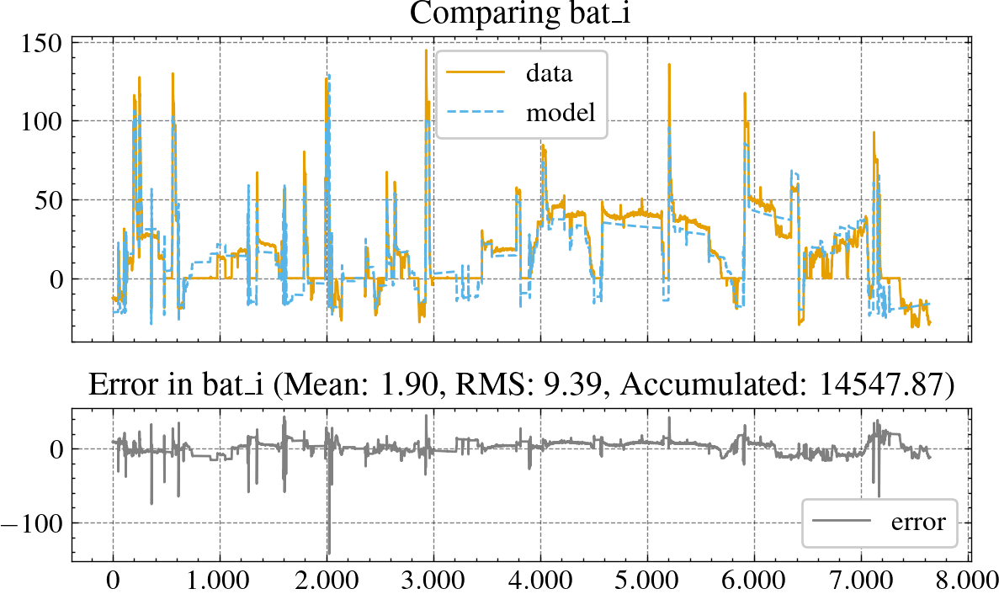

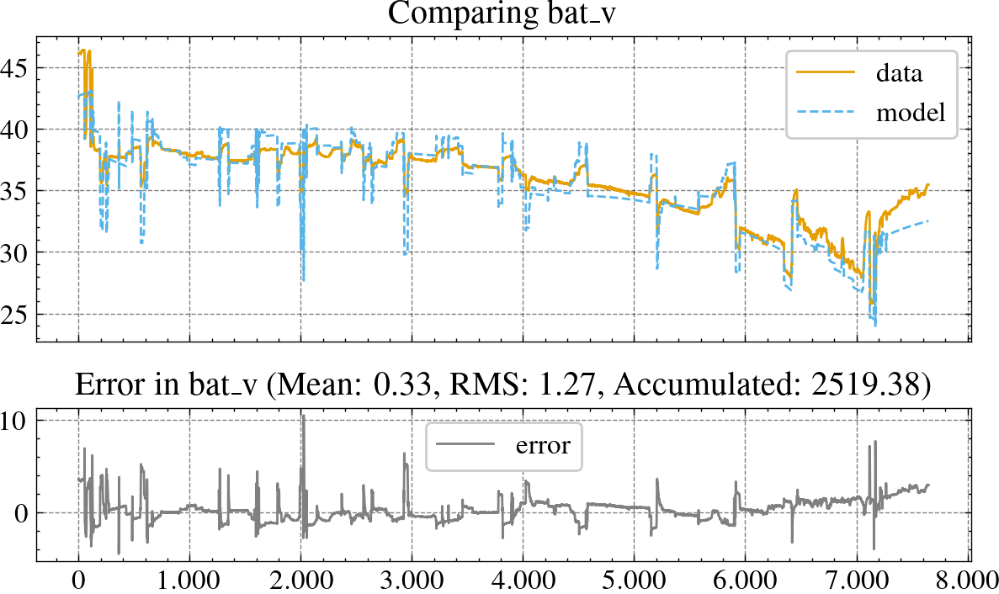

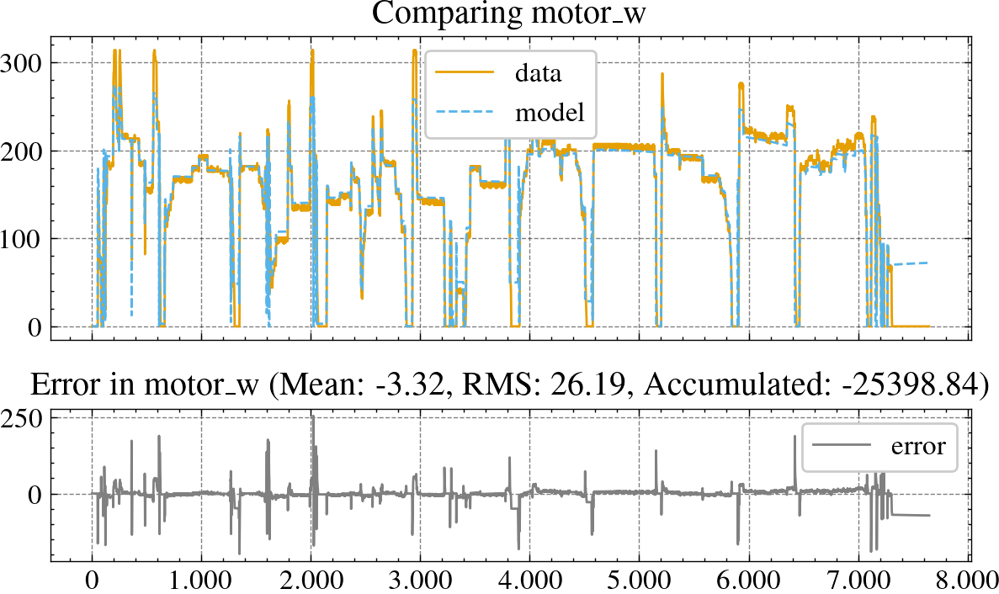

In [36]:
plot_compare('bat_i')
plot_compare('bat_v')
plot_compare('motor_w')

## Optimization: trying to optimize the entire system at once

In [37]:
def convert_params(params):
    if 'bat_coeff_0' not in params:
        return params

    n_coeffs = sum(1 for k in params if k.startswith('bat_coeff_'))
    return params | {'bat_coeffs': [params[f'bat_coeff_{i}'] for i in range(n_coeffs)]}

def func(T, U, X0, **params):
    return ct.input_output_response(
        SolarBoat.build(params=solar_boat_params | convert_params(params)),
        T=T,
        U=U,
        X0=X0,
        solve_ivp_method='Radau',
        # solve_ivp_kwargs=dict(
        #     max_step=1,
        # ),
    ).to_pandas()[['bat_i', 'bat_v', 'motor_w']].to_numpy()

params = lmfit.Parameters()
# params.add('bat_eff', value=solar_boat_params['bat_eff'], min=0.1, max=1.0, vary=False)
# params.add('bat_Q', value=solar_boat_params['bat_Q'], min=solar_boat_params['bat_Q']*min_mult, max=solar_boat_params['bat_Q']*max_mult, vary=False)
# params.add('bat_R_0', value=solar_boat_params['bat_R_0'], min=1e-4, max=0.1, vary=True, brute_step=0.1)
# params.add('bat_R_1', value=solar_boat_params['bat_R_1'], min=1e-4, max=0.1, vary=True, brute_step=0.1)
# params.add('bat_C_1', value=solar_boat_params['bat_C_1'], min=1, max=100, vary=True, brute_step=10)
# for i in range(0, len(solar_boat_params['bat_coeffs'])):
#     params.add(f'bat_coeff_{i}', value=solar_boat_params['bat_coeffs'][i], min=-1e3, max=1e3, vary=False)
# params.add('motor_R', value=solar_boat_params['motor_R'], min=1e-3, max=0.1, vary=True, brute_step=0.01)
# params.add('motor_L', value=solar_boat_params['motor_L'], min=1e-6, max=0.1, vary=True, brute_step=0.01)
params.add('motor_B', value=solar_boat_params['motor_B'], min=1e-3, max=1, vary=True, brute_step=0.1)
params.add('motor_J', value=solar_boat_params['motor_J'], min=1e-3, max=1, vary=True, brute_step=0.1)
# params.add('motor_J_load', value=solar_boat_params['motor_J_load'], min=solar_boat_params['motor_J_load']*min_mult, max=solar_boat_params['motor_J_load']*max_mult, vary=False)
# params.add('motor_K', value=solar_boat_params['motor_K'], min=solar_boat_params['motor_K']*min_mult, max=solar_boat_params['motor_K']*max_mult, vary=False)
params.add('prop_K', value=solar_boat_params['prop_K'], min=1e-3, max=0.1, vary=True, brute_step=0.1)
# params.add('prop_D', value=solar_boat_params['prop_D'], min=solar_boat_params['prop_D']*min_mult, max=solar_boat_params['prop_D']*max_mult, vary=False)
# params.add('rho', value=solar_boat_params['rho'], min=solar_boat_params['rho']*min_mult, max=solar_boat_params['rho']*max_mult, vary=False)
# params.add('trans_eff', value=solar_boat_params['trans_eff'], min=0.1, max=1.0, vary=False)
# params.add('esc_eff', value=solar_boat_params['esc_eff'], min=0.1, max=1.0, vary=False)
# params.add('trans_K', value=solar_boat_params['trans_K'], min=solar_boat_params['trans_K']*min_mult, max=solar_boat_params['trans_K']*max_mult, vary=False)


# display(params)

model = lmfit.Model(func=func, independent_vars=['T', 'U', 'X0'])

## Define data to fit
df = dfa.copy(deep=True)#[:1000]#.resample('30min').mean()
data = df[['bat_i', 'bat_v', 'motor_w']].copy(deep=True).to_numpy()

# Input data
T = (df.index[1] - df.index[0]).to_numpy().astype(np.float64) * 1e-9   # simulation time in seconds
lenT = len(df.index)
T = np.linspace(0, lenT * T, lenT, endpoint=False)  # Recreate the time array because of numerical issues from the index datetime to float transformation

U = df[['solar_poa', 'esc_d']].copy(deep=True).to_numpy().T

X0 = np.zeros(solar_boat.nstates)
X0[solar_boat.state_index['bat_SOC']] = 1

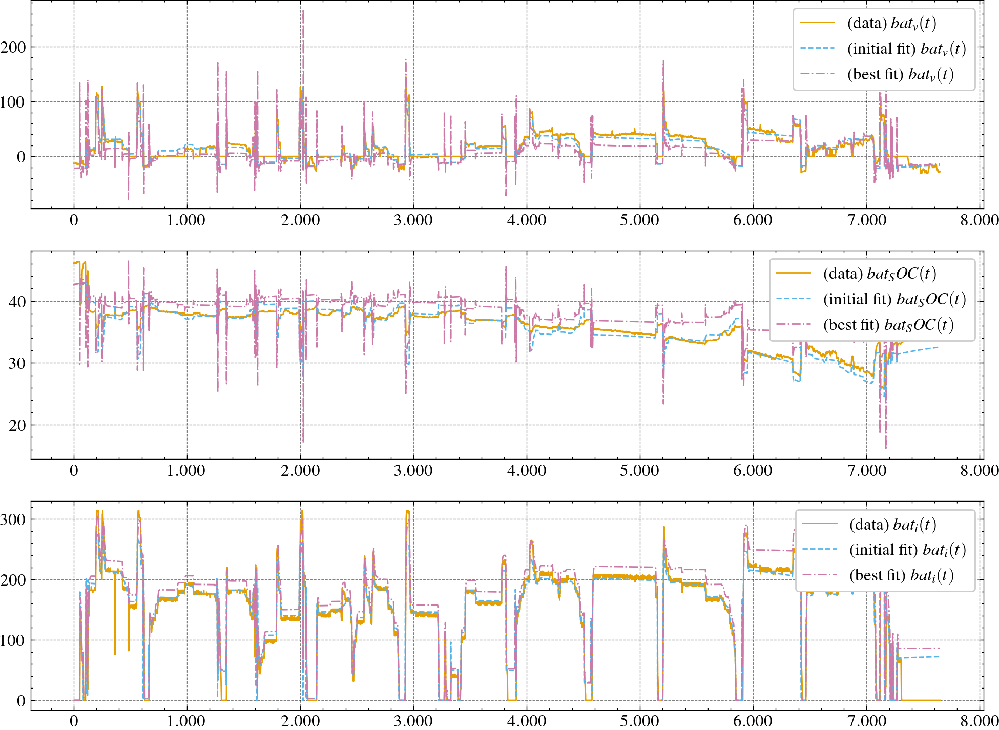

In [38]:
# Optimize
result = model.fit(
    data=data,
    params=params,
    T=T,
    U=U,
    X0=X0,
    method='brute',
    fit_kws=dict(
        workers=-1,
    ),
    max_nfev=1_000_000,
)

fig, ax = plt.subplots(result.data.shape[1], figsize=(12, 3*result.data.shape[1]))
for i, (initial, best, data) in enumerate(
    zip(result.init_fit.T, result.best_fit.T, result.data.T)
):
    label = SolarBoat.build({}).output_labels[i]

    ax[i].plot(data, label=f'(data) ${label}(t)$')
    ax[i].plot(initial, label=f'(initial fit) ${label}(t)$')
    ax[i].plot(best, label=f'(best fit) ${label}(t)$')
    ax[i].legend(loc=1)

plt.show()

result


# Example of use: optimizing duty cycle

Processing: 100%|██████████| 20/20 [02:38<00:00,  7.93s/iteration, avg_runs_per_minute=7.56]


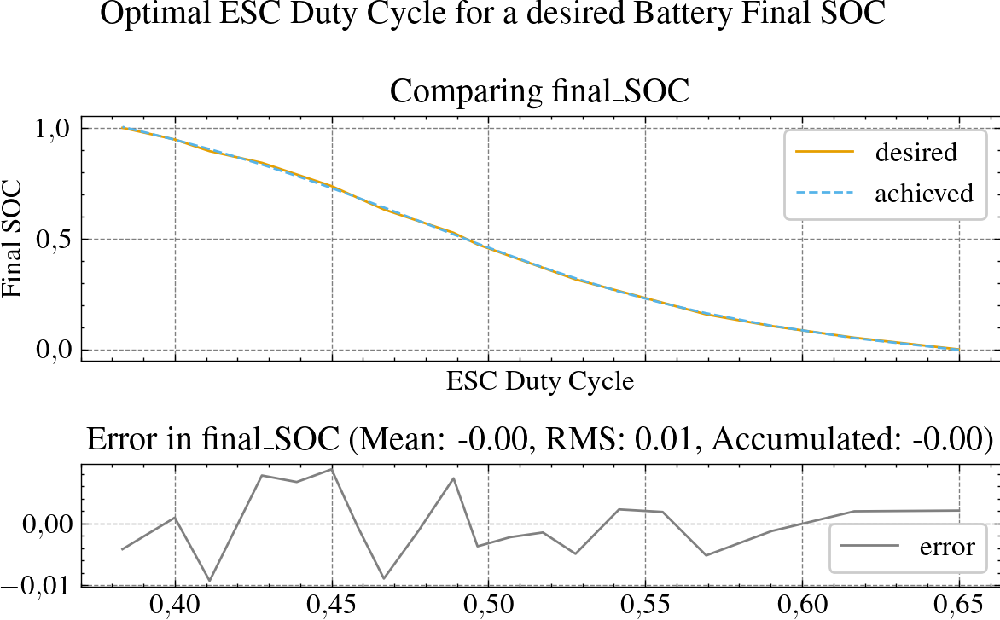

,desired_final_SOC,achieved_final_SOC,esc_d,error
0,0.000000,-0.002093,0.650000,-0.002093
1,0.052632,0.050657,0.616667,-0.001975
2,0.105263,0.106490,0.590278,0.001227
3,0.157895,0.163056,0.569444,0.005161
4,0.210526,0.208656,0.555556,-0.001870
5,0.263158,0.260876,0.541667,-0.002282
6,0.315789,0.320689,0.527778,0.004899
7,0.368421,0.369867,0.517361,0.001446
8,0.421053,0.423261,0.506944,0.002208
9,0.473684,0.477373,0.496528,0.003689


In [39]:
import numpy as np
from scipy import optimize
from tqdm import tqdm
import time

def fun(x, T, U, X0, final_SOC, tolerance):
    U[1] = np.ones_like(U[1]) * x
    soc = ct.input_output_response(
        SolarBoat.build(params=solar_boat_params),
        T=T,
        U=U,
        X0=X0,
        solve_ivp_method='Radau',
    ).to_pandas()[['bat_SOC']].to_numpy()[-1, 0]

    if abs(soc - final_SOC) <= tolerance:
        return 0
    else:
        return (soc - final_SOC)**2

def optimize_duty_cycle(df: pd.DataFrame, initial_SOC: float, final_SOC: float, tolerance = 0.01, bounds=(0, 1), grid=10):
    # Input data
    T = (df.index[1] - df.index[0]).to_numpy().astype(np.float64) * 1e-9
    lenT = len(df.index)
    T = np.linspace(0, lenT * T, lenT, endpoint=False)

    U = df[['solar_poa', 'esc_d']].copy(deep=True).to_numpy().T

    X0 = np.zeros(solar_boat.nstates)
    X0[solar_boat.state_index['bat_SOC']] = initial_SOC

    result = optimize.brute(
        fun,
        ranges=[bounds],
        args=(T, U, X0, final_SOC, tolerance),
        Ns=grid, # grid
        full_output=False,
        workers=-1,
        finish=optimize.fmin,
    )
    optimized_esc_dt = result[0]

    # Evaluate
    U[1] = np.ones_like(U[1]) * optimized_esc_dt
    resulting_final_soc = ct.input_output_response(
        SolarBoat.build(params=solar_boat_params),
        T=T,
        U=U,
        X0=X0,
        solve_ivp_method='Radau',
    ).to_pandas()[['bat_SOC']].to_numpy()[-1][0]

    return resulting_final_soc, optimized_esc_dt

def plot_dt_optimization(res):
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [2, 1]})

    ax1.plot(res['esc_d'], res['desired_final_SOC'], label='desired')
    ax1.plot(res['esc_d'], res['achieved_final_SOC'], label='achieved')
    ax1.set_title(f'Comparing final_SOC')
    ax1.legend()
    ax1.set_ylabel('Final SOC')
    ax1.set_xlabel('ESC Duty Cycle')

    error = res['desired_final_SOC'].to_numpy() - res['achieved_final_SOC'].to_numpy()

    ax2.plot(res['esc_d'], error, label='error', color='gray')

    mean_error = np.mean(error)
    rms_error = np.sqrt(np.mean(error**2))
    accumulated_error = np.sum(error)

    ax2.set_title(f'Error in final_SOC (Mean: {mean_error:.2f}, RMS: {rms_error:.2f}, Accumulated: {accumulated_error:.2f})')
    ax2.legend()

    plt.suptitle('Optimal ESC Duty Cycle for a desired Battery Final SOC')
    plt.tight_layout()
    plt.show()


initial_SOC = 1
final_SOCs = np.linspace(0, 1, 20)
res = []

total_iterations = len(final_SOCs)

with tqdm(total=total_iterations, desc="Processing", unit="iteration") as pbar:
    start_time = time.time()  # Start time for average runs per minute calculation

    for final_SOC in final_SOCs:

        soc, dt = optimize_duty_cycle(df, initial_SOC, final_SOC)

        res.append((final_SOC, soc, dt, soc - final_SOC))

        # Update progress bar
        pbar.update(1)

        # Update average runs per minute
        elapsed_time = time.time() - start_time
        avg_runs_per_minute = pbar.n / (elapsed_time / 60)
        pbar.set_postfix(avg_runs_per_minute=avg_runs_per_minute)

res = pd.DataFrame(res, columns=['desired_final_SOC', 'achieved_final_SOC', 'esc_d', 'error'])

plot_dt_optimization(res)

res

# Example of duty cycle optimization under arbitrary conditions
Multiple arbitrary:
  - Race durations
  - Irradiation conditions
  - Battery final SOC


In [19]:
from datetime import timedelta, datetime
import itertools
import numpy as np
import pandas as pd
from tqdm import tqdm
import time

race_durations = np.array([
    timedelta(minutes=5),
    timedelta(minutes=15),
    timedelta(minutes=30),
    timedelta(minutes=45),
    timedelta(hours=1),
    timedelta(hours=1.5),
    timedelta(hours=2),
    timedelta(hours=2.5),
    timedelta(hours=3),
    timedelta(hours=3.5),
    timedelta(hours=4),
    timedelta(hours=5),
])

irradiations = np.linspace(0, 1200, 21, endpoint=True)
initial_SOC = 1
final_SOCs = np.linspace(0, 1, 21)
start_date = datetime(year=2024, month=6, day=16, hour=10)
res = []

total_iterations = len(final_SOCs) * len(race_durations) * len(irradiations)

with tqdm(total=total_iterations, desc="Processing", unit="iteration") as pbar:
    start_time = time.time()  # Start time for average runs per minute calculation

    for (final_SOC, race_duration, irradiation) in itertools.product(final_SOCs, race_durations, irradiations):

        timestamp = pd.date_range(start=start_date, end=start_date + race_duration, freq='min')

        solar_poa = np.ones(timestamp.shape) * irradiation
        esc_d = np.zeros(timestamp.shape)
        df = pd.DataFrame(dict(timestamp=timestamp, solar_poa=solar_poa, esc_d=esc_d)).set_index('timestamp')

        try:
            soc, dt = optimize_duty_cycle(df, initial_SOC, final_SOC)
            error = soc - final_SOC
        except RuntimeError as e:
            soc, dt = None, None
            error = None

        res.append((final_SOC, soc, dt, error, race_duration, irradiation))

        # Update progress bar
        pbar.update(1)

        # Update average runs per minute
        elapsed_time = time.time() - start_time
        avg_runs_per_minute = pbar.n / (elapsed_time / 60)
        pbar.set_postfix(avg_runs_per_minute=avg_runs_per_minute)

res = pd.DataFrame(res, columns=['desired_final_SOC', 'achieved_final_SOC', 'esc_d', 'error', 'race_duration', 'irradiation']).dropna()
res.to_csv('optimize_duty_cycle.csv', index=False)
res


Processing: 100%|██████████| 5292/5292 [1:28:08<00:00,  1.00iteration/s, avg_runs_per_minute=60]  


,desired_final_SOC,achieved_final_SOC,esc_d,error,race_duration,irradiation
0,0.0,0.747083,1.000000,0.747083,0 days 00:05:00,0.0
1,0.0,0.749734,1.000000,0.749734,0 days 00:05:00,60.0
2,0.0,0.752360,1.000000,0.752360,0 days 00:05:00,120.0
3,0.0,0.754963,1.000000,0.754963,0 days 00:05:00,180.0
4,0.0,0.757543,1.000000,0.757543,0 days 00:05:00,240.0
...,...,...,...,...,...,...
5287,1.0,0.991172,0.450000,-0.008828,0 days 05:00:00,960.0
5288,1.0,1.008899,0.455556,0.008899,0 days 05:00:00,1020.0
5289,1.0,1.003282,0.466667,0.003282,0 days 05:00:00,1080.0
5290,1.0,0.996440,0.477778,-0.003560,0 days 05:00:00,1140.0


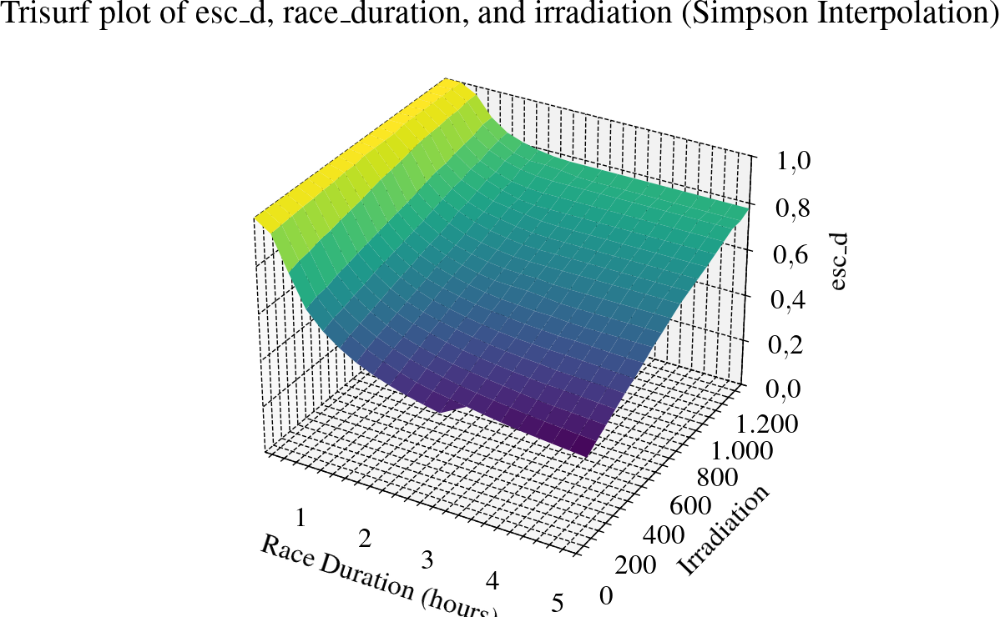

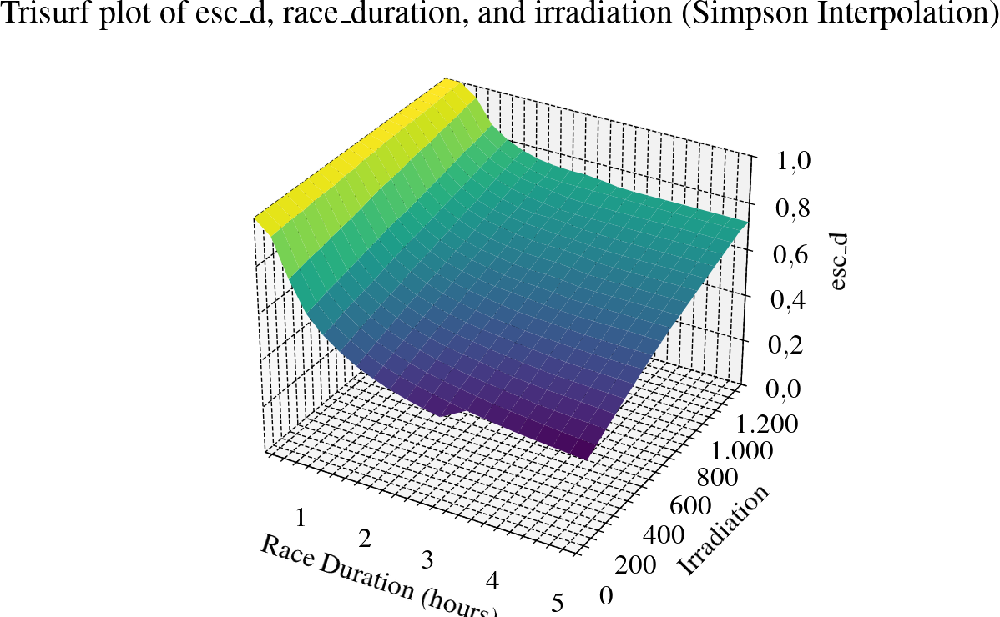

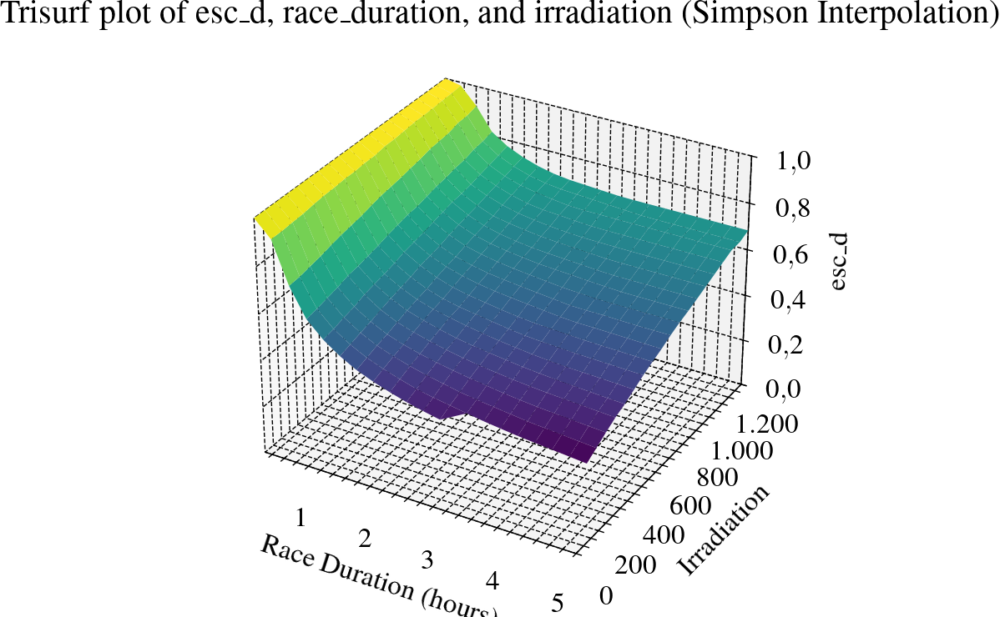

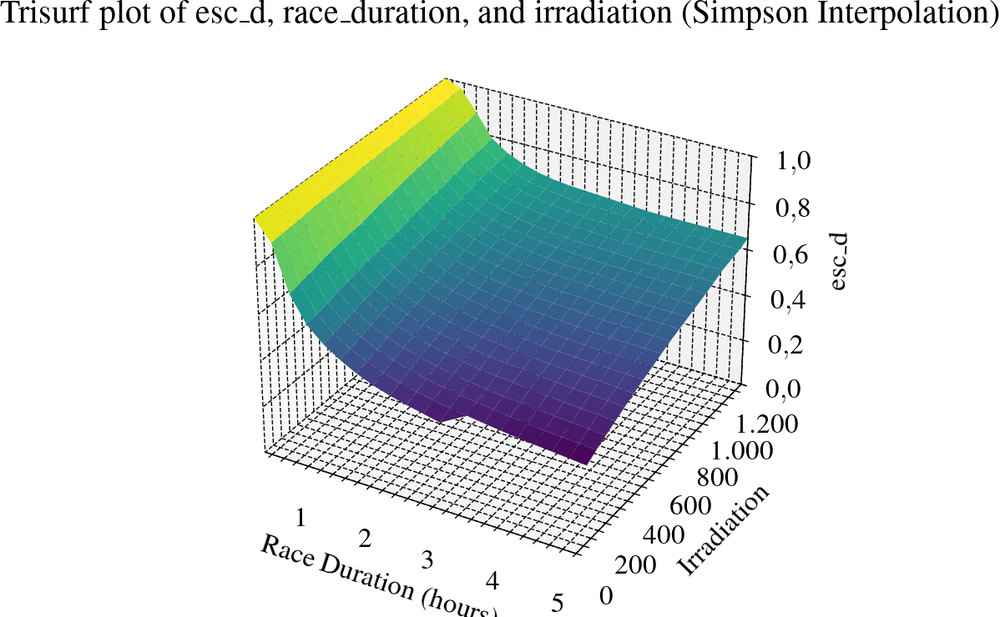

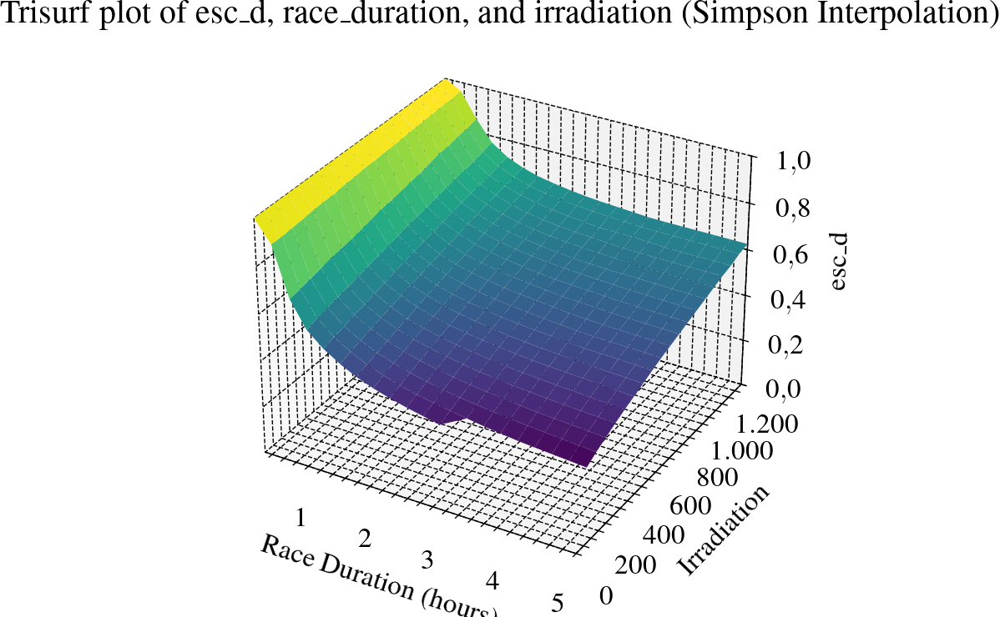

...

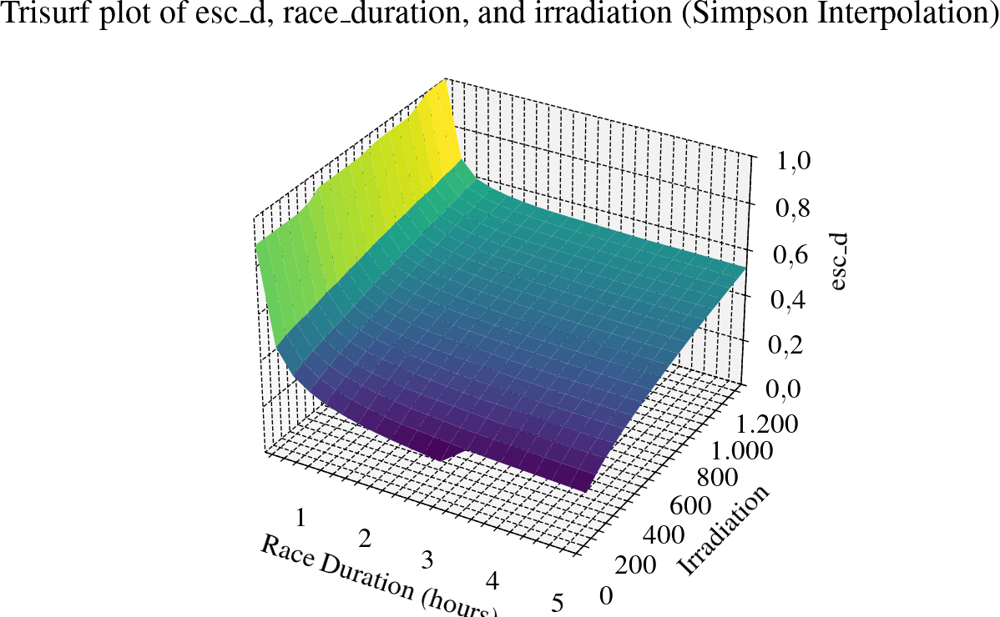

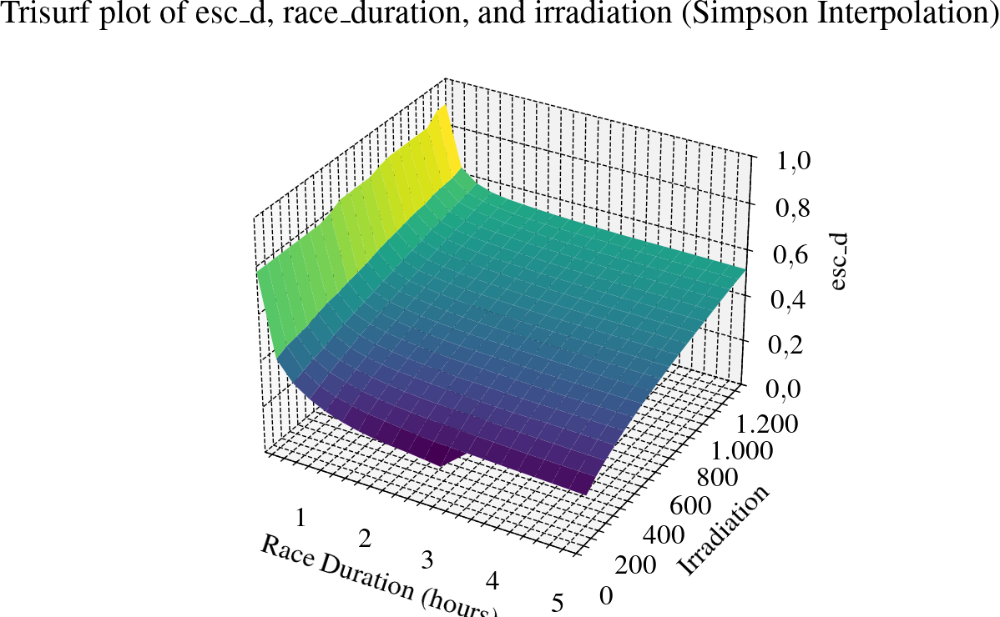

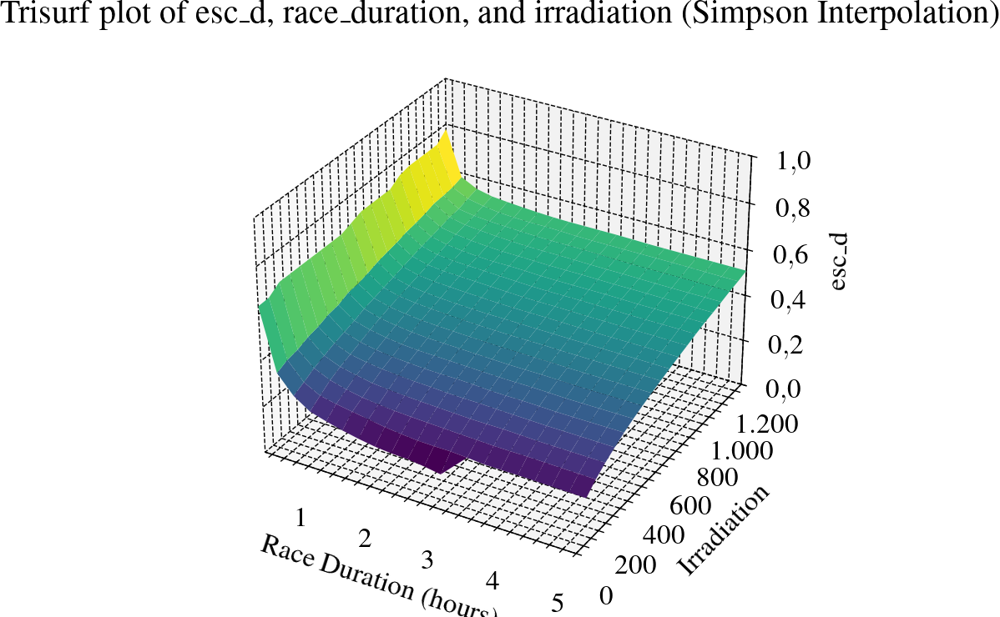

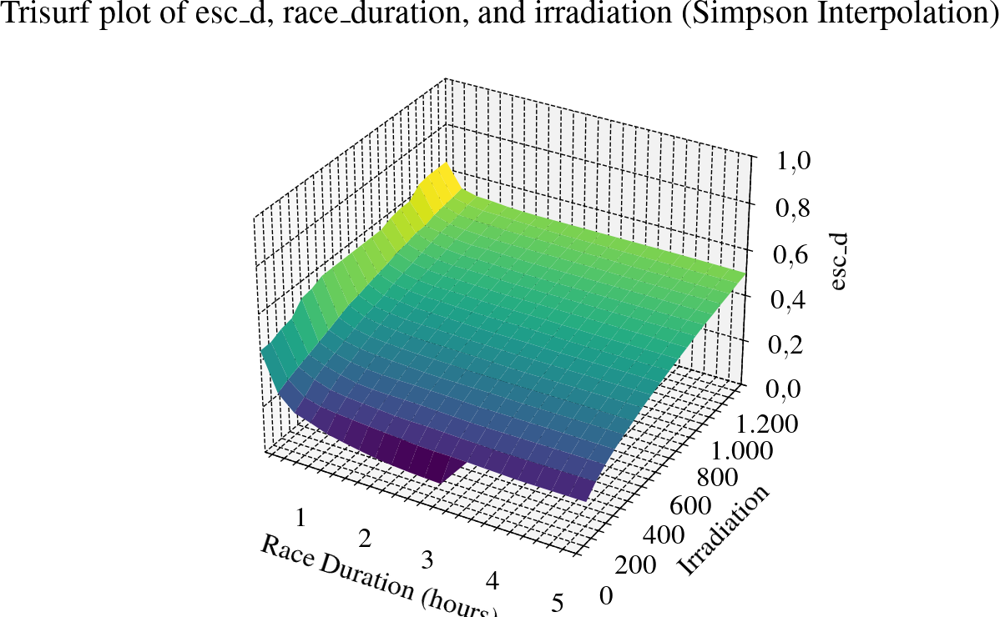

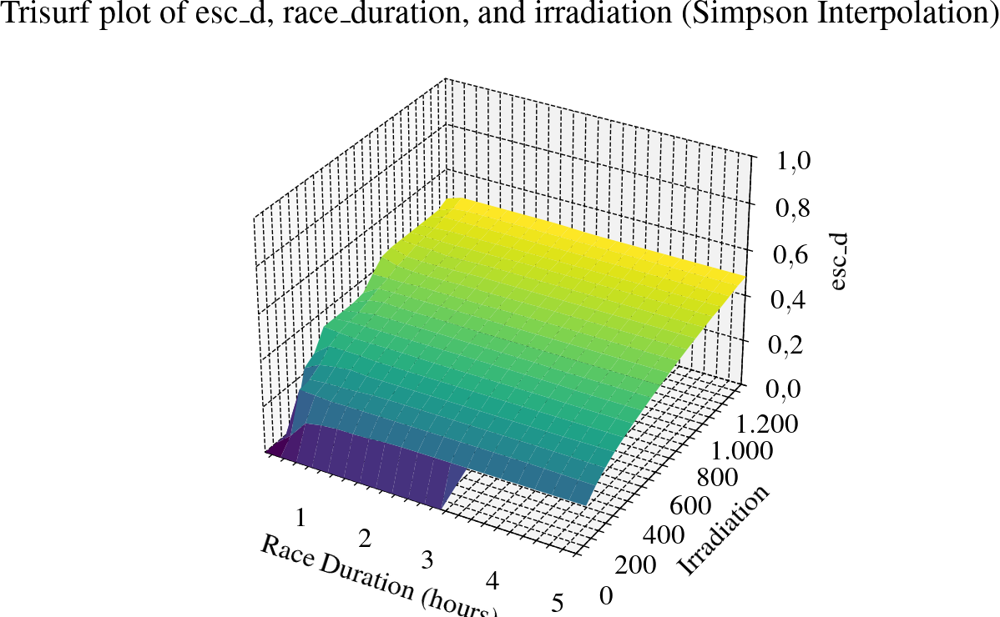

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata

res = pd.read_csv('optimize_duty_cycle2.csv')
res['race_duration'] = pd.to_timedelta(res['race_duration'])
res.replace([np.inf, -np.inf], np.nan, inplace=True)
res.dropna(inplace=True)

# Convert race_duration to hours for plotting
res['race_duration'] = res['race_duration'].dt.total_seconds() / 3600

# Unique desired_final_SOC values
desired_final_SOCs = res['desired_final_SOC'].unique()
# desired_final_SOCs = np.append(desired_final_SOCs[::3], desired_final_SOCs[-1])

xmin, xmax = res['race_duration'].min(), res['race_duration'].max()
ymin, ymax = res['irradiation'].min(), res['irradiation'].max()
zmin, zmax = res['esc_d'].min(), res['esc_d'].max()

for desired_final_SOC in desired_final_SOCs:
    # Filter data for current desired_final_SOC
    grouped_res = res[res['desired_final_SOC'] == desired_final_SOC].copy(deep=True).groupby(['race_duration', 'irradiation']).mean().reset_index()

    # Create grid for interpolation
    samples = 20
    race_duration_high_freq = np.linspace(grouped_res['race_duration'].min(), grouped_res['race_duration'].max(), samples)
    irradiation_high_freq = np.linspace(grouped_res['irradiation'].min(), grouped_res['irradiation'].max(), samples)
    race_durations_grid, irradiations_grid = np.meshgrid(race_duration_high_freq, irradiation_high_freq)

    # Interpolate esc_d values using griddata
    esc_d_grid = griddata((grouped_res['race_duration'], grouped_res['irradiation']), grouped_res['esc_d'],
                        (race_durations_grid, irradiations_grid), method='linear')

    # Create 3D plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    # Plot the surface
    surf = ax.plot_surface(race_durations_grid, irradiations_grid, esc_d_grid, cmap='viridis', edgecolor='none')

    # Labels
    ax.set_xlabel('Race Duration (hours)')
    ax.set_ylabel('Irradiation')
    ax.set_zlabel('esc_d')

    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_zlim(zmin, zmax)

    # Title
    ax.set_title('Trisurf plot of esc_d, race_duration, and irradiation (Simpson Interpolation)')

    # Add color bar which maps values to colors
    # fig.colorbar(trisurf, shrink=0.5, aspect=5)

    plt.tight_layout()

    plt.show()


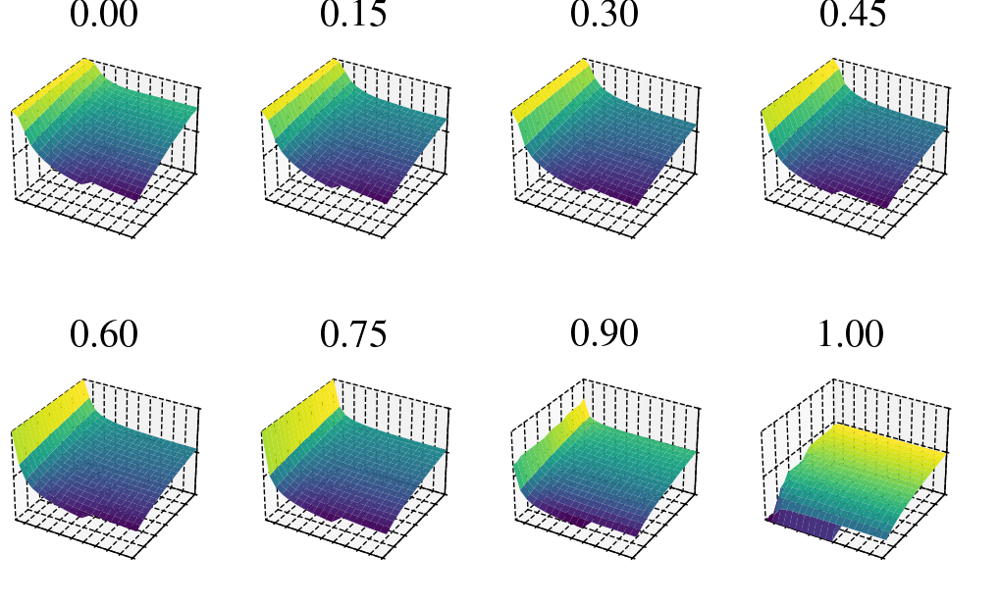

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata

res = pd.read_csv('optimize_duty_cycle2.csv')
res['race_duration'] = pd.to_timedelta(res['race_duration'])
res.replace([np.inf, -np.inf], np.nan, inplace=True)
res.dropna(inplace=True)

# Convert race_duration to hours for plotting
res['race_duration'] = res['race_duration'].dt.total_seconds() / 3600

# Unique desired_final_SOC values
desired_final_SOCs = res['desired_final_SOC'].unique()
desired_final_SOCs = np.append(desired_final_SOCs[::3], desired_final_SOCs[-1])

xmin, xmax = res['race_duration'].min(), res['race_duration'].max()
ymin, ymax = res['irradiation'].min(), res['irradiation'].max()
zmin, zmax = res['esc_d'].min(), res['esc_d'].max()

# Number of desired_final_SOC values
num_plots = len(desired_final_SOCs)

# Define constants
max_rows = 4
num_cols = 4
plots_per_fig = max_rows * num_cols

# Calculate the number of figures needed
num_figs = (num_plots + plots_per_fig - 1) // plots_per_fig

for fig_idx in range(num_figs):
    # Determine the range of SOCs for this figure
    start_idx = fig_idx * plots_per_fig
    end_idx = min(start_idx + plots_per_fig, num_plots)
    current_SOCs = desired_final_SOCs[start_idx:end_idx]

    # Calculate number of rows needed for the current figure
    num_rows = (len(current_SOCs) + num_cols - 1) // num_cols

    # Create figure and axes
    fig, axs = plt.subplots(num_rows, num_cols, subplot_kw={'projection': '3d'}, squeeze=True)
    axs = axs.flatten()

    for i, desired_final_SOC in enumerate(current_SOCs):
        # Filter data for current desired_final_SOC
        grouped_res = res[res['desired_final_SOC'] == desired_final_SOC].copy(deep=True).groupby(['race_duration', 'irradiation']).mean().reset_index()

        # Create grid for interpolation
        samples = 20
        race_duration_high_freq = np.linspace(grouped_res['race_duration'].min(), grouped_res['race_duration'].max(), samples)
        irradiation_high_freq = np.linspace(grouped_res['irradiation'].min(), grouped_res['irradiation'].max(), samples)
        race_durations_grid, irradiations_grid = np.meshgrid(race_duration_high_freq, irradiation_high_freq)

        # Interpolate esc_d values using griddata
        esc_d_grid = griddata((grouped_res['race_duration'], grouped_res['irradiation']), grouped_res['esc_d'],
                            (race_durations_grid, irradiations_grid), method='linear')

        # Plot 3D surface on the current subplot
        ax = axs[i]

        # Plot the surface
        # surf = ax.plot_trisurf(race_durations_grid.ravel(), irradiations_grid.ravel(), esc_d_grid.ravel(), cmap='viridis', edgecolor='none')
        surf = ax.plot_surface(race_durations_grid, irradiations_grid, esc_d_grid, cmap='viridis', edgecolor='none')

        # Labels
        # ax.set_xlabel('Race Duration (hours)', labelpad=4)
        # ax.set_ylabel('Irradiation', labelpad=4)
        # ax.set_zlabel('esc_d', labelpad=4)

        # Title
        ax.set_title(f'{desired_final_SOC:.2f}')

        # Set the same axis limits for all plots
        ax.set_xlim(xmin, xmax)
        ax.set_ylim(ymin, ymax)
        ax.set_zlim(zmin, zmax)

        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_zticklabels([])


    # Hide unused subplots
    for j in range(len(current_SOCs), len(axs)):
        fig.delaxes(axs[j])

    # fig.get_layout_engine().set(w_pad=2 / 72, h_pad=2 / 72, hspace=0.2, wspace=0.2)

    plt.show()


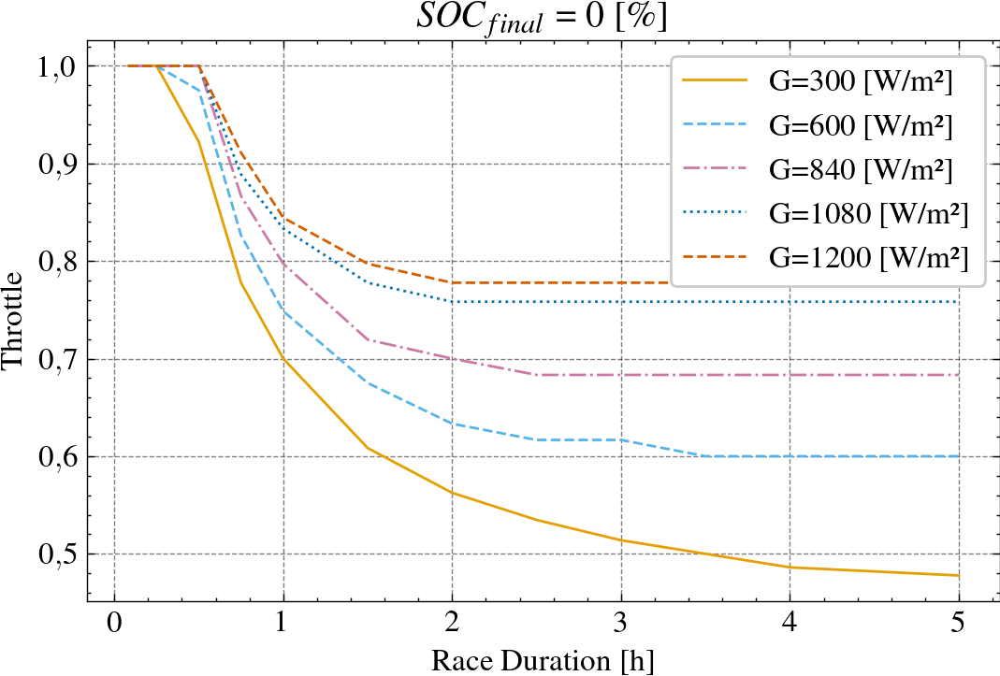

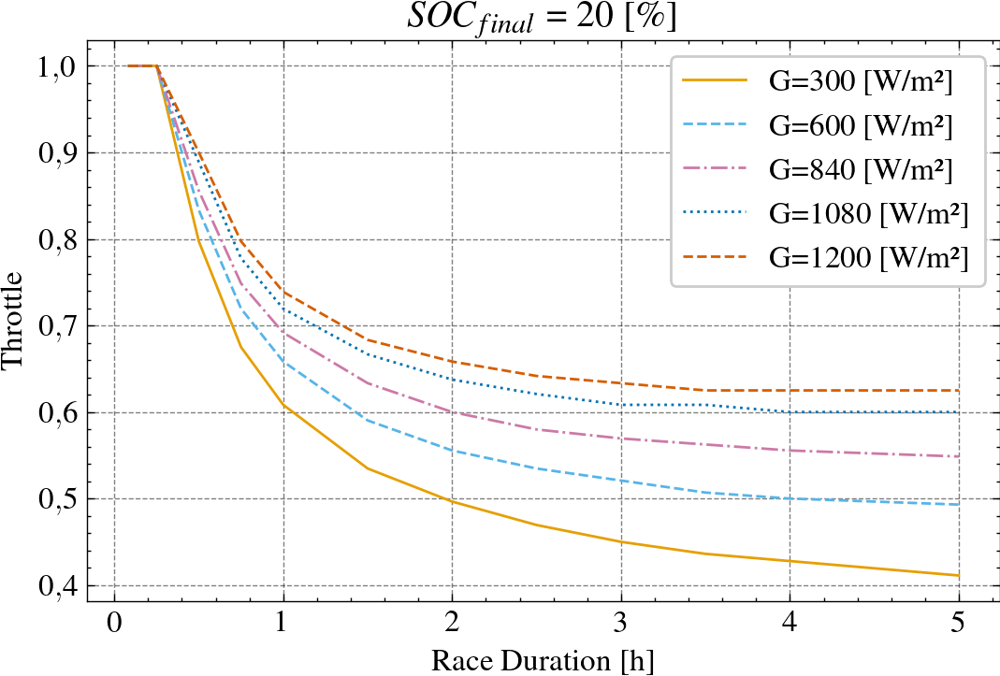

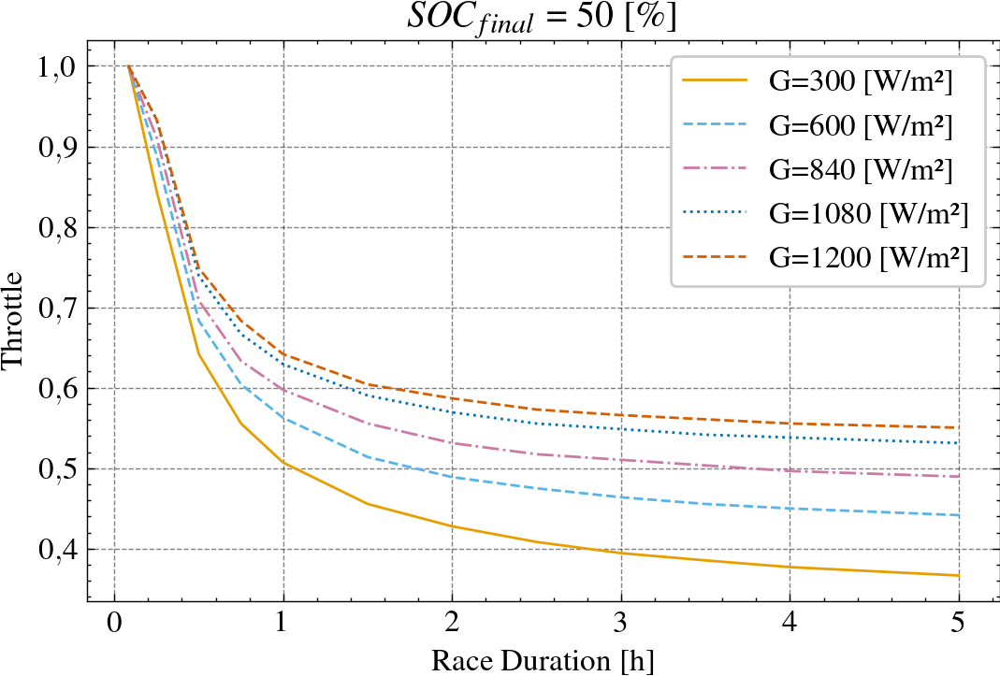

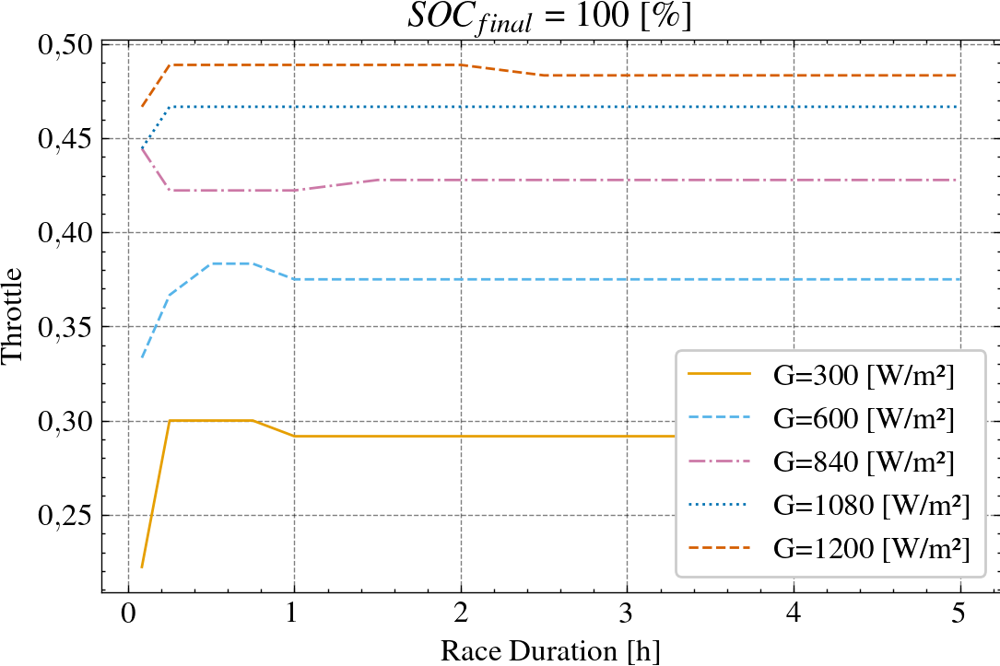

In [2]:
import pandas as pd
import numpy as np
import itertools
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata

df = pd.read_csv('optimize_duty_cycle2.csv')
df['race_duration'] = pd.to_timedelta(df['race_duration'])
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

# Convert race_duration to hours for plotting
df['race_duration'] = df['race_duration'].dt.total_seconds() / 3600

df = df.set_index(['desired_final_SOC', 'irradiation'])[['esc_d', 'race_duration']].sort_index()

irradiations = [300, 600, 840, 1080, 1200]
final_SOCs = [0.0, 0.2, 0.5, 1.0]

for final_SOC in final_SOCs:

    plt.figure()

    for irradiation in irradiations:

        try:
            dfa = df.loc[pd.IndexSlice[final_SOC, irradiation], :]
        except KeyError:
            continue

        plt.plot(dfa['race_duration'], dfa['esc_d'], label=f'G={irradiation} [W/m²]')

    plt.legend()
    plt.title('$SOC_{final}$' + f' = {100 * final_SOC :.0f} [\%]')
    plt.xlabel('Race Duration [h]')
    plt.ylabel('Throttle')

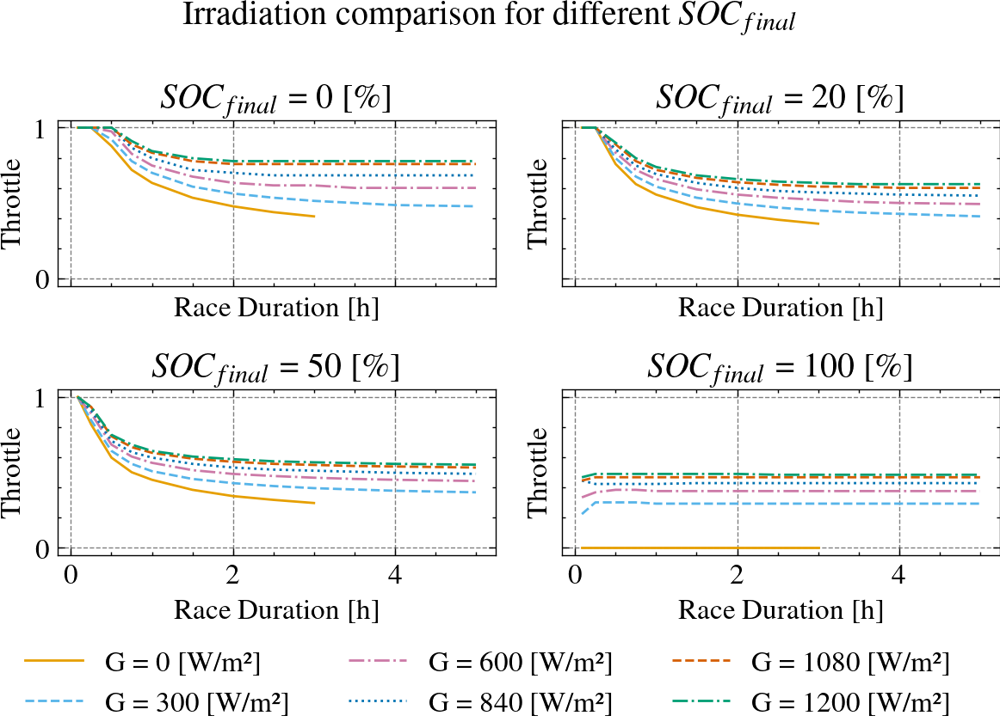

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv('optimize_duty_cycle2.csv')
df['race_duration'] = pd.to_timedelta(df['race_duration'])
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

# Convert race_duration to hours for plotting
df['race_duration'] = df['race_duration'].dt.total_seconds() / 3600

df = df.set_index(['desired_final_SOC', 'irradiation'])[['esc_d', 'race_duration']].sort_index()

irradiations = [0, 300, 600, 840, 1080, 1200]
final_SOCs = [0.0, 0.2, 0.5, 1.0]

# Determine the layout of subplots
n_rows = 2
n_cols = 2

fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True)
axes = axes.flatten()

for i, final_SOC in enumerate(final_SOCs):
    ax = axes[i]

    for irradiation in irradiations:
        try:
            dfa = df.loc[pd.IndexSlice[final_SOC, irradiation], :]
        except KeyError:
            continue

        ax.plot(dfa['race_duration'], dfa['esc_d'], label=f'G = {irradiation} [W/m²]')

    ax.set_title('$SOC_{final}$' + f' = {100 * final_SOC :.0f} [\%]')
    ax.set_xlabel('Race Duration [h]')
    ax.set_ylabel('Throttle')

fig_save_and_show(filename=None, save_title='', show_title='Irradiation comparison for different $SOC_{final}$', ncol=3)


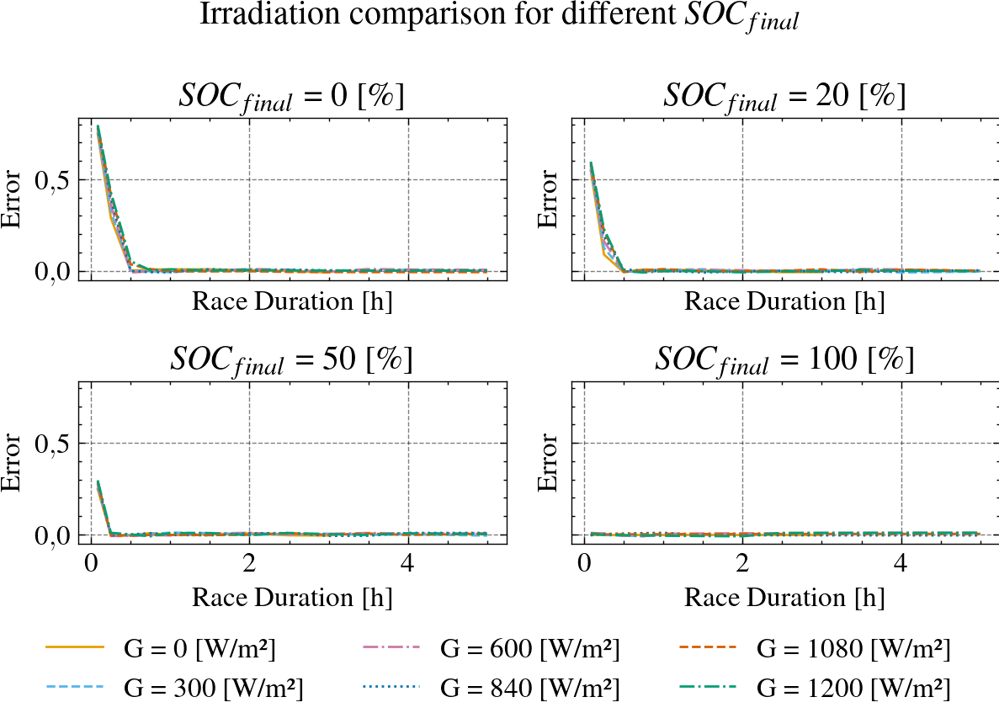

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv('optimize_duty_cycle2.csv')
df['race_duration'] = pd.to_timedelta(df['race_duration'])
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

# Convert race_duration to hours for plotting
df['race_duration'] = df['race_duration'].dt.total_seconds() / 3600

df = df.set_index(['desired_final_SOC', 'irradiation'])[['race_duration', 'error']].sort_index()

irradiations = [0, 300, 600, 840, 1080, 1200]
final_SOCs = [0.0, 0.2, 0.5, 1.0]

# Determine the layout of subplots
n_rows = 2
n_cols = 2

fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True)
axes = axes.flatten()

for i, final_SOC in enumerate(final_SOCs):
    ax = axes[i]

    for irradiation in irradiations:
        try:
            dfa = df.loc[pd.IndexSlice[final_SOC, irradiation], :]
        except KeyError:
            continue

        ax.plot(dfa['race_duration'], dfa['error'], label=f'G = {irradiation} [W/m²]')

    ax.set_title('$SOC_{final}$' + f' = {100 * final_SOC :.0f} [\%]')
    ax.set_xlabel('Race Duration [h]')
    ax.set_ylabel('Error')

fig_save_and_show(filename=None, save_title='', show_title='Irradiation comparison for different $SOC_{final}$', ncol=3)


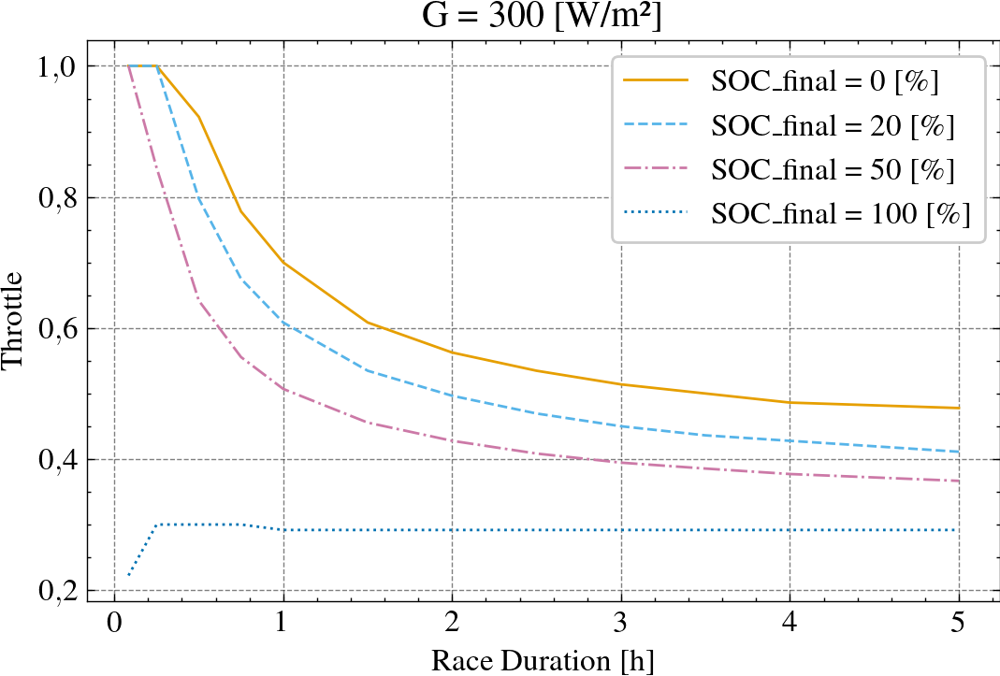

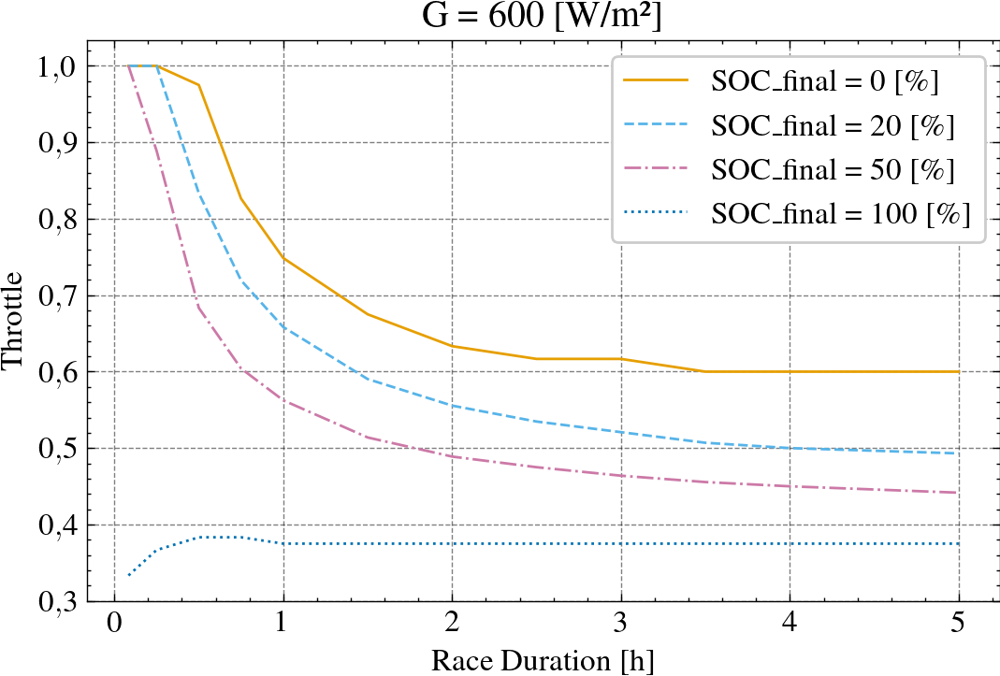

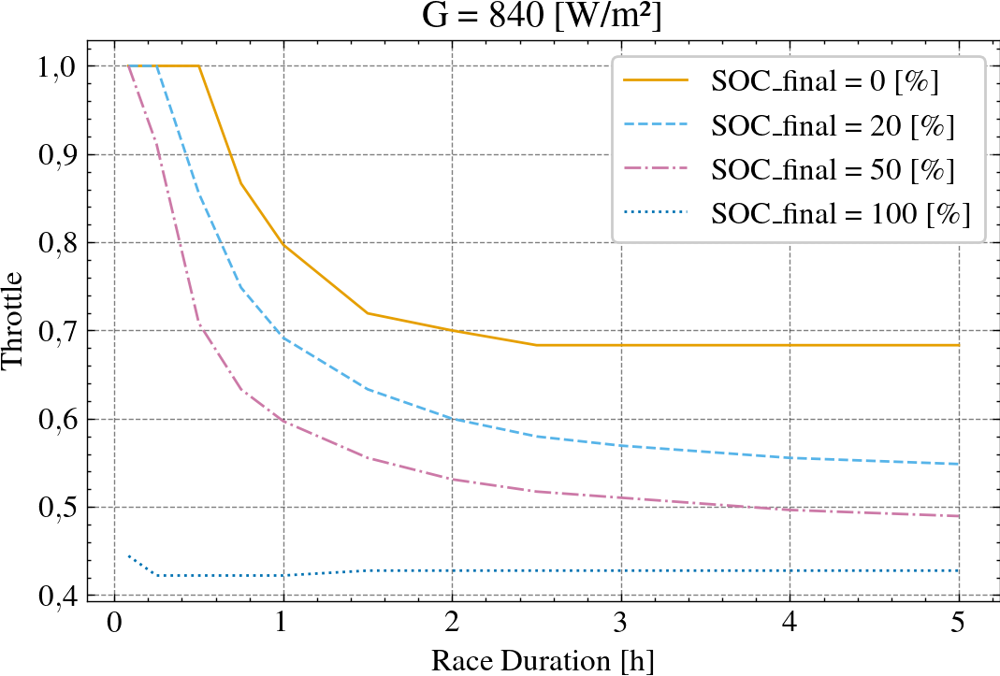

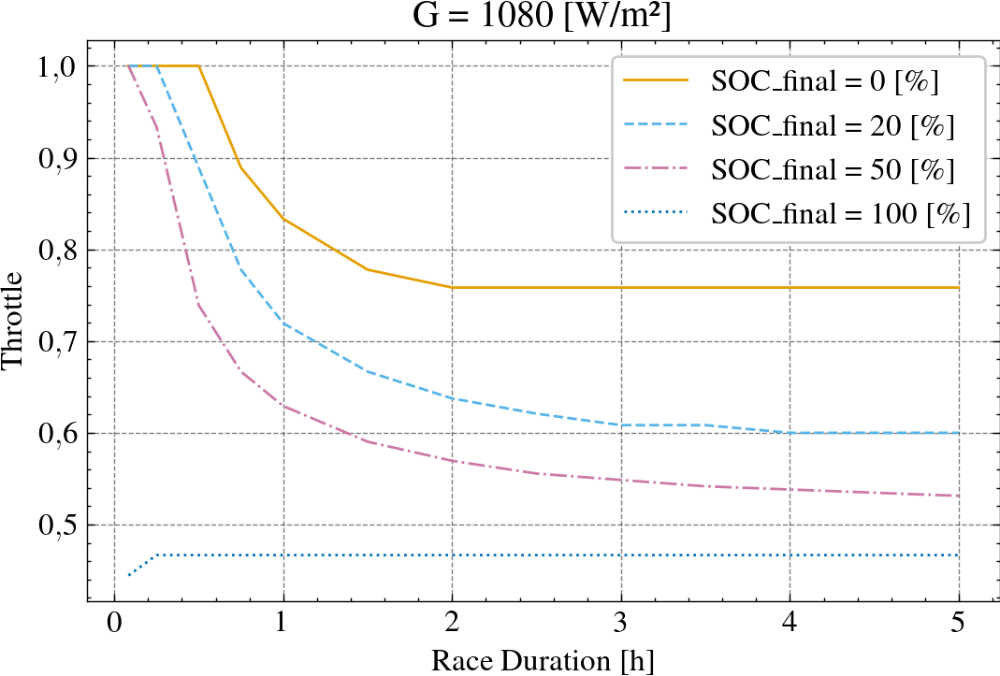

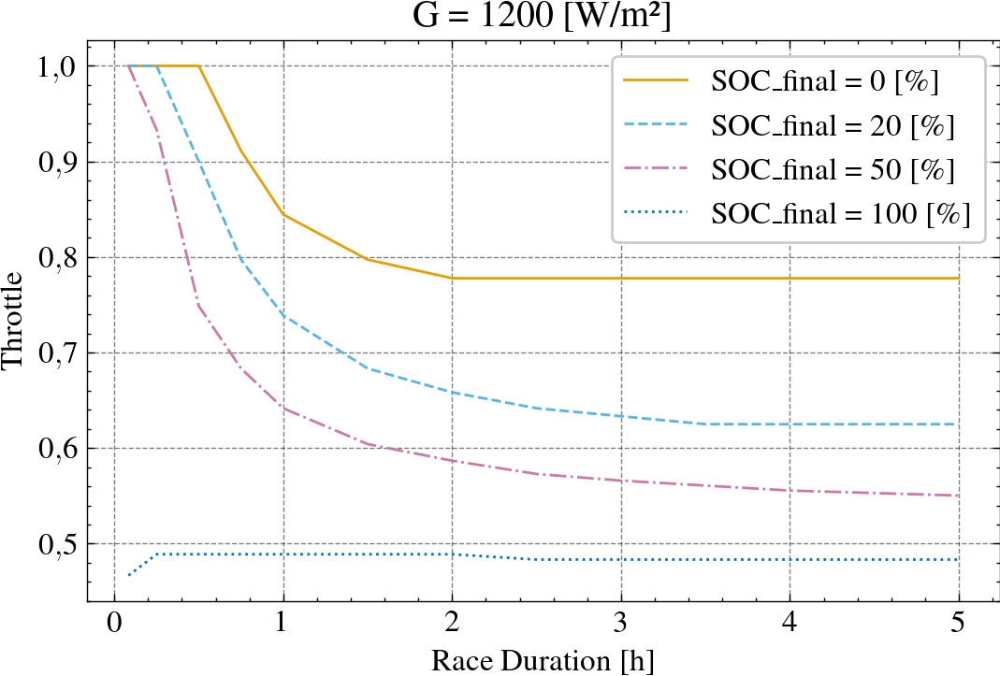

In [4]:
import pandas as pd
import numpy as np
import itertools
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata

df = pd.read_csv('optimize_duty_cycle2.csv')
df['race_duration'] = pd.to_timedelta(df['race_duration'])
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

# Convert race_duration to hours for plotting
df['race_duration'] = df['race_duration'].dt.total_seconds() / 3600

df = df.set_index(['desired_final_SOC', 'irradiation'])[['esc_d', 'race_duration']].sort_index()

irradiations = [300, 600, 840, 1080, 1200]
final_SOCs = [0.0, 0.2, 0.5, 1.0]

for irradiation in irradiations:

    plt.figure()

    for final_SOC in final_SOCs:

        try:
            dfa = df.loc[pd.IndexSlice[final_SOC, irradiation], :]
        except KeyError:
            continue

        plt.plot(dfa['race_duration'], dfa['esc_d'], label='SOC_{final}' + f' = {100 * final_SOC :.0f} [\%]')

    plt.legend()
    plt.title(f'G = {irradiation} [W/m²]')
    plt.xlabel('Race Duration [h]')
    plt.ylabel('Throttle')

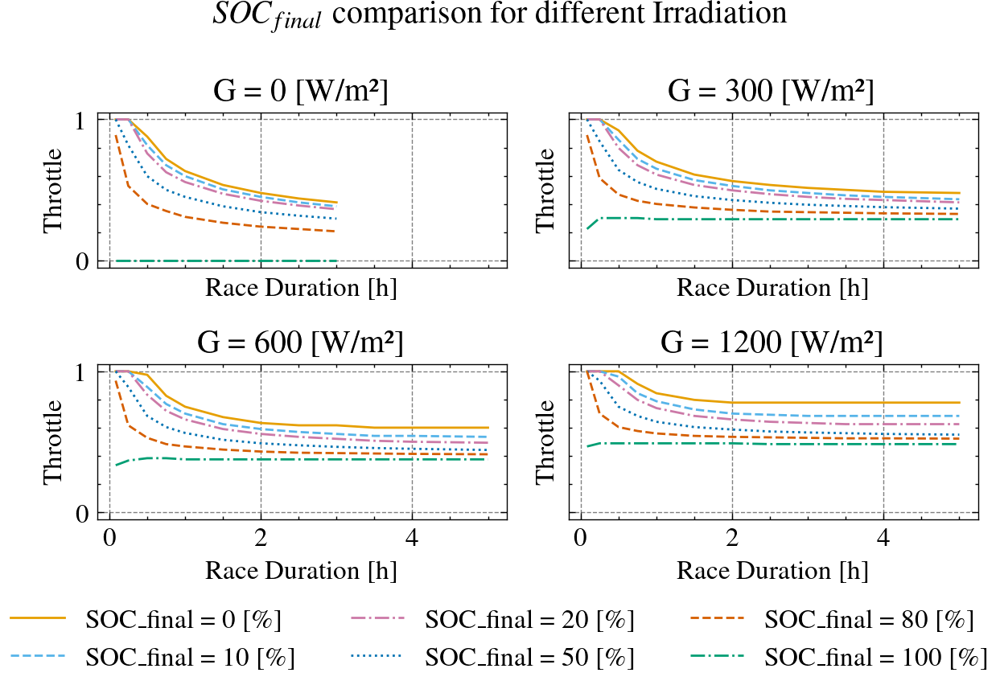

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv('optimize_duty_cycle2.csv')
df['race_duration'] = pd.to_timedelta(df['race_duration'])
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

# Convert race_duration to hours for plotting
df['race_duration'] = df['race_duration'].dt.total_seconds() / 3600

df = df.set_index(['desired_final_SOC', 'irradiation'])[['esc_d', 'race_duration']].sort_index()

irradiations = [0, 300, 600, 1200]
final_SOCs = [0.0, 0.1, 0.2, 0.5, 0.8, 1.0]

# Determine the layout of subplots
n_rows = 2
n_cols = 2

fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True)
axes = axes.flatten()

for i, irradiation in enumerate(irradiations):
    ax = axes[i]

    for final_SOC in final_SOCs:
        try:
            dfa = df.loc[pd.IndexSlice[final_SOC, irradiation], :]
        except KeyError:
            continue

        ax.plot(dfa['race_duration'], dfa['esc_d'], label='SOC_{final}' + f' = {100 * final_SOC :.0f} [\%]')

    ax.set_title(f'G = {irradiation} [W/m²]')
    ax.set_xlabel('Race Duration [h]')
    ax.set_ylabel('Throttle')

fig_save_and_show(filename=None, save_title='', show_title='$SOC_{final}$ comparison for different Irradiation', ncol=3)


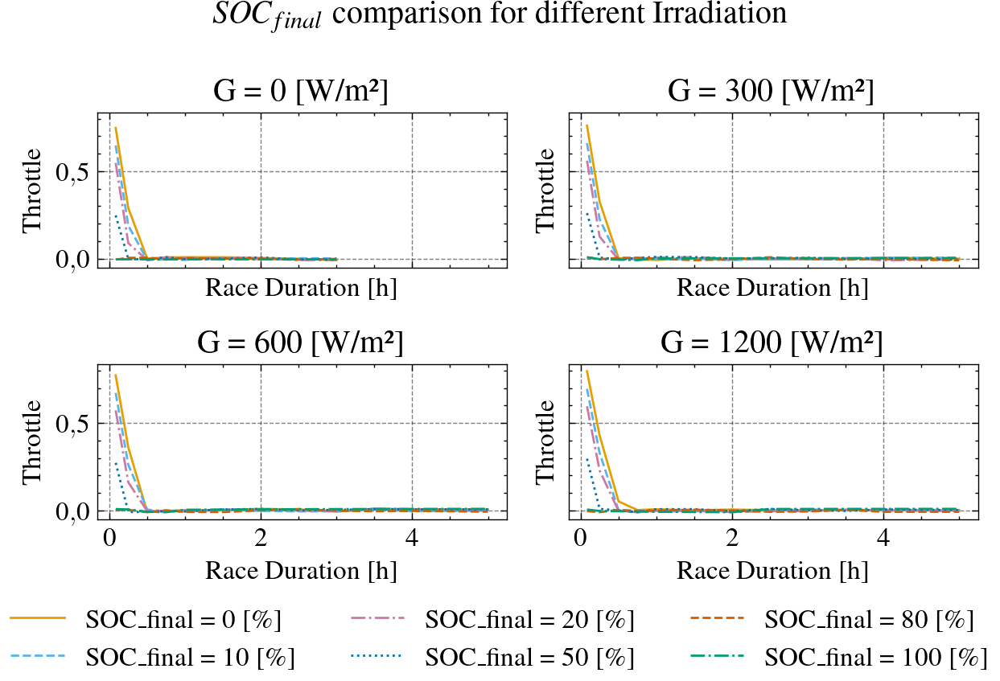

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv('optimize_duty_cycle2.csv')
df['race_duration'] = pd.to_timedelta(df['race_duration'])
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

# Convert race_duration to hours for plotting
df['race_duration'] = df['race_duration'].dt.total_seconds() / 3600

df = df.set_index(['desired_final_SOC', 'irradiation'])[['race_duration', 'error']].sort_index()

irradiations = [0, 300, 600, 1200]
final_SOCs = [0.0, 0.1, 0.2, 0.5, 0.8, 1.0]

# Determine the layout of subplots
n_rows = 2
n_cols = 2

fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True)
axes = axes.flatten()

for i, irradiation in enumerate(irradiations):
    ax = axes[i]

    for final_SOC in final_SOCs:
        try:
            dfa = df.loc[pd.IndexSlice[final_SOC, irradiation], :]
        except KeyError:
            continue

        ax.plot(dfa['race_duration'], dfa['error'], label='SOC_{final}' + f' = {100 * final_SOC :.0f} [\%]')

    ax.set_title(f'G = {irradiation} [W/m²]')
    ax.set_xlabel('Race Duration [h]')
    ax.set_ylabel('Throttle')

fig_save_and_show(filename=None, save_title='', show_title='$SOC_{final}$ comparison for different Irradiation', ncol=3)


time         30.000000
G             0.000000
D             1.000000
bat_v        35.300976
bat_SOC       0.973312
bat_i        59.211120
bat_ii        0.000000
esc_ii       59.211120
motor_w     128.683088
motor_v      35.300976
motor_q       4.389756
bat_i_R1     59.216636
motor_i      47.368896
dtype: float64
time         30.000000
G             0.000000
D             1.000000
bat_v        35.300976
bat_SOC       0.973312
bat_i        59.211120
bat_ii        0.000000
esc_ii       59.211120
motor_w     128.683088
motor_v      35.300976
motor_q       4.389756
bat_i_R1     59.216636
motor_i      47.368896
dtype: float64
time         30.000000
G             0.000000
D             1.000000
bat_v        35.300976
bat_SOC       0.973312
bat_i        59.211120
bat_ii        0.000000
esc_ii       59.211120
motor_w     128.683088
motor_v      35.300976
motor_q       4.389756
bat_i_R1     59.216636
motor_i      47.368896
dtype: float64
time         30.000000
G             0.000000
D           

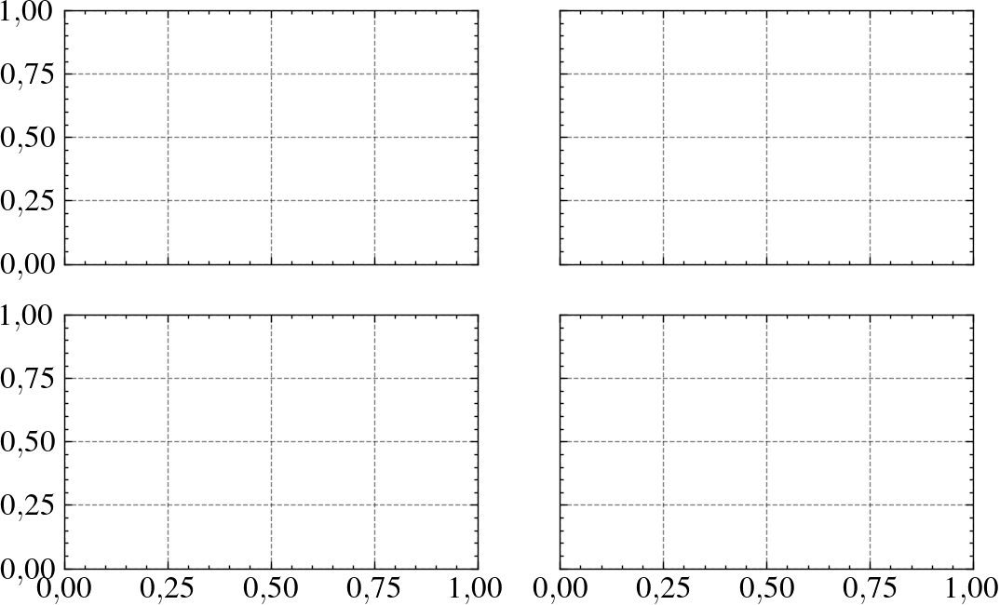

In [23]:
from datetime import timedelta, datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv('optimize_duty_cycle.csv')
df['race_duration'] = pd.to_timedelta(df['race_duration'])
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

# Convert race_duration to hours for plotting
df['race_duration'] = df['race_duration'].dt.total_seconds() / 3600

# Unique desired_final_SOC values
desired_final_SOCs = df['desired_final_SOC'].unique()

df = df.set_index(['desired_final_SOC', 'irradiation'])[['esc_d', 'race_duration']].sort_index()

irradiations = [0, 300, 600, 840, 1080, 1200]
final_SOCs = [0.0, 0.2, 0.5, 1.0]

# Determine the layout of subplots
n_rows = 2
n_cols = 2

fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True)
axes = axes.flatten()

for i, final_SOC in enumerate(final_SOCs):
    ax = axes[i]

    for irradiation in irradiations:
        try:
            dfa = df.loc[pd.IndexSlice[final_SOC, irradiation], :]
        except KeyError:
            continue

        for race_duration in dfa['race_duration']:

            # Prepare data
            start_date = datetime(year=2024, month=6, day=16, hour=10)
            timestamp = pd.date_range(start=start_date, end=start_date + timedelta(minutes=race_duration), freq='min')

            if len(timestamp) <= 1:
                continue;

            for esc_d in df['esc_d']:

                solar_poa = np.ones(timestamp.shape) * irradiation

                esc_d = np.ones(timestamp.shape) * esc_d

                dfb = pd.DataFrame(dict(timestamp=timestamp, solar_poa=solar_poa, esc_d=esc_d)).set_index('timestamp')

                # Simulate
                T = (dfb.index[1] - dfb.index[0]).to_numpy().astype(np.float64) * 1e-9
                lenT = len(dfb.index)
                T = np.linspace(0, lenT * T, lenT, endpoint=False)
                U = dfb[['solar_poa', 'esc_d']].T
                X0 = np.zeros(solar_boat.nstates)
                X0[solar_boat.state_index['bat_SOC']] = initial_SOC
                dfc = ct.input_output_response(
                    SolarBoat.build(params=solar_boat_params),
                    T=T,
                    U=U,
                    X0=X0,
                    solve_ivp_method='Radau',
                ).to_pandas().mean()

                print(dfc)

                break
            break
        break

        # ax.plot(dfa['race_duration'].dt.total_seconds() / 3600, dfc['esc_d'], label=f'G = {irradiation} [W/m²]')

#     ax.set_title('$SOC_{final}$' + f' = {100 * final_SOC :.0f} [\%]')
#     ax.set_xlabel('Race Duration [h]')
#     ax.set_ylabel('Throttle')

# fig_save_and_show(filename=None, save_title='', show_title='Irradiation comparison for different $SOC_{final}$', ncol=3)
